![headline image](images/background5.png)

<br><br><center><b><font size="6">Modeling and Forecasting Crime Rate in Colorado </font></b></center>

<br><br><span style="color:black; font-size:1.5em">**Data Science Capstone Project, Part IV; (modeling crime rate of various crime categories)**</span><br>
* Student name: <b>Elena Kazakova</b>
* Student pace: <b>Full-time</b>
* Cohort: <b>DS02222021</b>
* Scheduled project review date: <span style="color:red"><b>07/26/2021</b></span>
* Instructor name: <b>James Irving</b>
* Application url: <span style="color:red"><b>TBD</b></span>


<br><br><left><b><font size="5">TABLE OF CONTENTS </font></b></left><br>


- **[Introduction](#INTRODUCTION)<br>**
- **[Imports](#Imports)**<br>
- **[MODEL and iNTERPRET](#MODEL&iNTERPRET)**<br>


# Introduction

<span style="color:black; font-size:1.2em">This is part III of the Capstone Project, the previous parts can be found in the following notebooks:<br>
     1. [Part I](capstone_sql_cleanup.ipynb), creation of SQLite database with the original data and preprocessing of the data in the tables of the databases and building DataFrames.<br>
    2. [Part II](capstone_project_cleanup_EDA.ipynb), preprocessing of the data in DataFrames and EDA<br>
    3. [Part III](capstone_project_general_crime_modeling.ipynb), modeling of the General Crime rate</span><br><br>

**If you are running this notebook without restarting the kernel replace '%load_ext autoreload' in imports with '%reload_ext autoreload'**

# Imports

In [1]:
# Importing packages
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import statsmodels
import statsmodels.tsa.api as tsa
import plotly.express as px
import plotly.io as pio
import math
from math import sqrt
import holidays
import pmdarima as pm

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

from pmdarima.arima.stationarity  import ADFTest
from pmdarima.arima.utils import ndiffs
from pmdarima.arima.utils import nsdiffs

import pickle
import os
import json

from pathlib import Path
import subprocess
import io
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning)

from functions_all import *

%load_ext autoreload
%autoreload 2
%matplotlib inline

# MODEL&iNTEPRET

## Splitting into a training and a test sets

<br><span style="font-size:1.2em;">I am cutting off a ~10% tail of my data to create a test set.</span><br>

In [2]:
with open('data/pickled_ts/ts_weekly.pickle', 'rb') as f:
    ts_weekly=pickle.load(f)

Observations: 262 weeks
Training Observations: 236 weeks
Testing Observations: 26 weeks


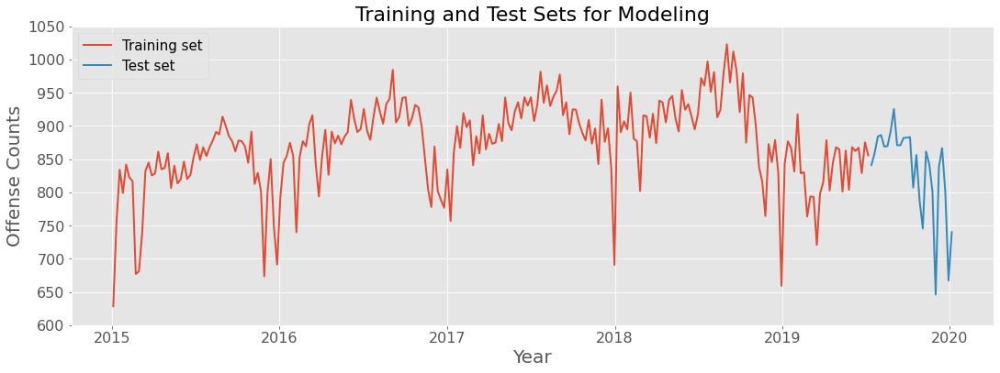

In [3]:
train_size = round(len(ts_weekly) * 0.90)
ts_train, ts_test = ts_weekly[:train_size], ts_weekly[train_size:]
print('Observations: %d weeks' % (len(ts_weekly)))
print('Training Observations: %d weeks' % (len(ts_train)))
print('Testing Observations: %d weeks' % (len(ts_test)))

fig=display_figure_w_TSs(ts_train, ts_test, 'Training set', 'Test set', 'Training and Test Sets for Modeling')


## Crime Rate per Offense Category Modeling

### Loading the dictionaries with time-series

In [4]:
with open('data/pickled_ts/TS_crime_category.pickle', 'rb') as f:
    TS_crime_category=pickle.load(f)
    
with open('data/pickled_ts/TS_crime_against.pickle', 'rb') as f:
    TS_crime_against=pickle.load(f)
        
with open('data/pickled_ts/TS_crime_location.pickle', 'rb') as f:
    TS_crime_location=pickle.load(f)

### Checking for stationarity

#### Checking the stationarity of the time-series in Offense category dictionary

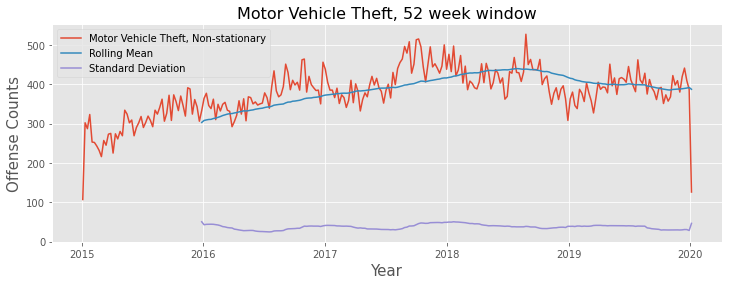

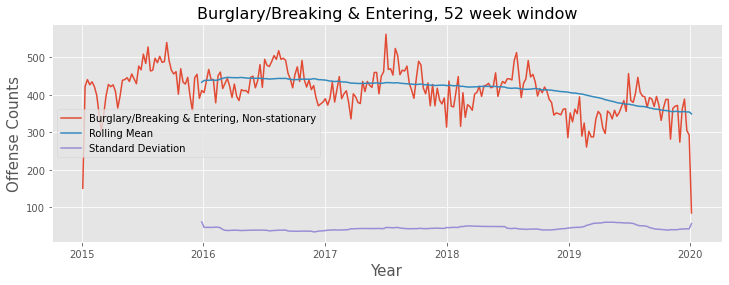

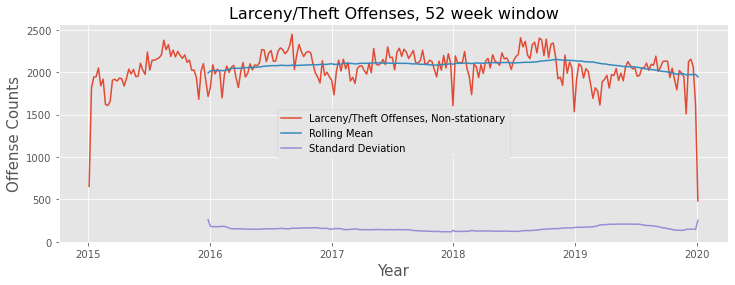

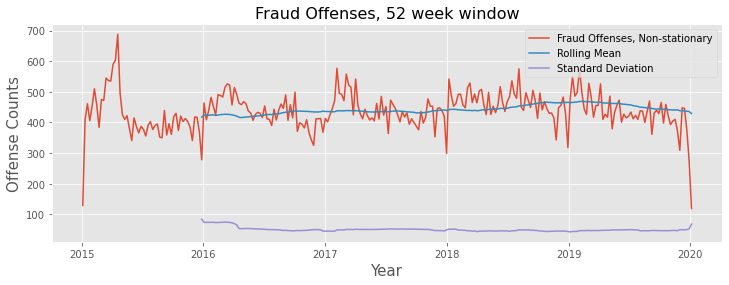

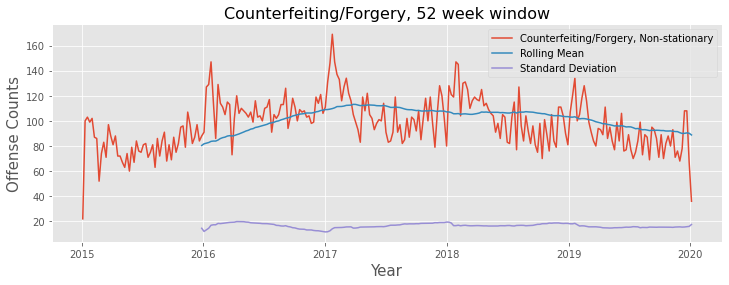

...

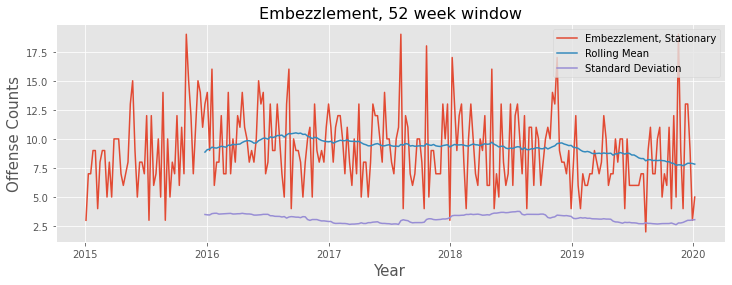

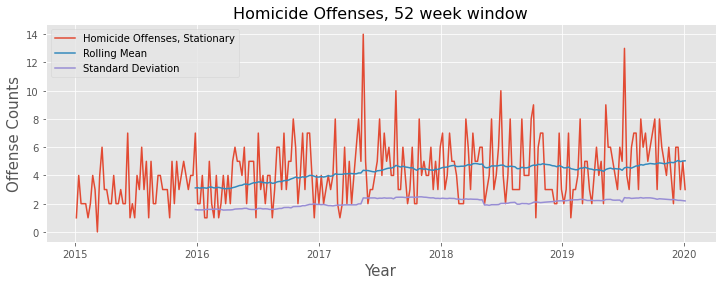

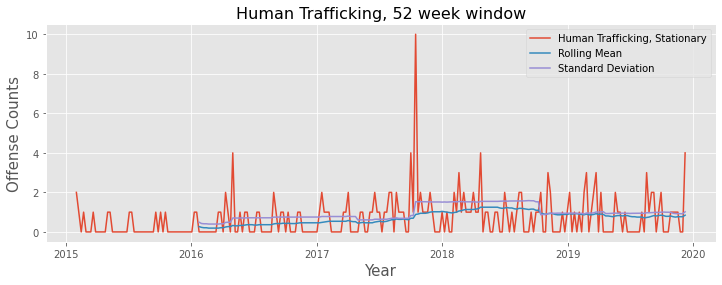

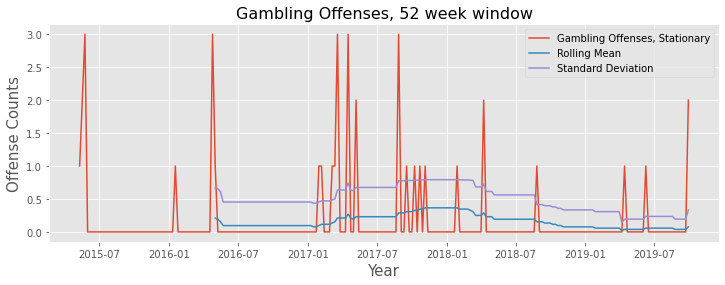

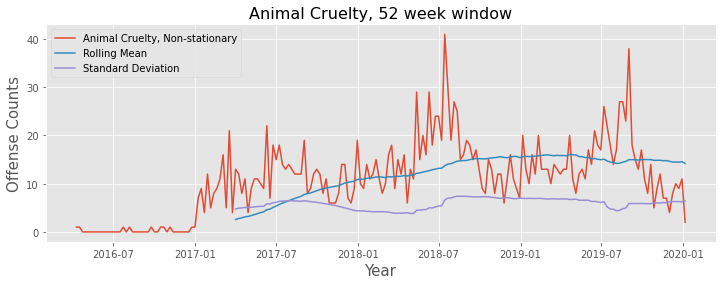

In [5]:
df_results1, ts_stationary1, ts_non_stationary_diff1=check_stationarity_multiple(TS_crime_category, window=52, plot=True)

In [6]:
df_results1

,Crime Category,Critical Value,P-value,Lags,Observations,"Critical value, 1%","Critical value, 5%","Critical value, 10%",Stationary?
Number,,,,,,,,,
1,Motor Vehicle Theft,-2.47862,0.120763,7,254,-3.45636,-2.87299,-2.57287,False
2,Burglary/Breaking & Entering,-1.57887,0.494197,3,258,-3.45595,-2.87281,-2.57277,False
3,Larceny/Theft Offenses,-2.07108,0.256303,4,257,-3.45605,-2.87285,-2.5728,False
4,Fraud Offenses,-2.34796,0.156966,16,245,-3.45733,-2.87341,-2.5731,False
5,Counterfeiting/Forgery,-2.55755,0.102093,4,257,-3.45605,-2.87285,-2.5728,False
6,Assault Offenses,-2.36468,0.151953,3,258,-3.45595,-2.87281,-2.57277,False
7,Destruction/Damage/Vandalism of Property,-1.47935,0.543701,4,257,-3.45605,-2.87285,-2.5728,False
8,Arson,-5.43906,2.80274e-06,3,258,-3.45595,-2.87281,-2.57277,True
9,Drug/Narcotic Offenses,-3.0009,0.0348101,3,258,-3.45595,-2.87281,-2.57277,True


<br><br><span style="font-size:1.2em; background:pink">There are **12** time-series that are already stationary and **11** that are not and which require additional processing (differencing).</span><br><br>
    
    

#### Differencing the time series that are not stationary

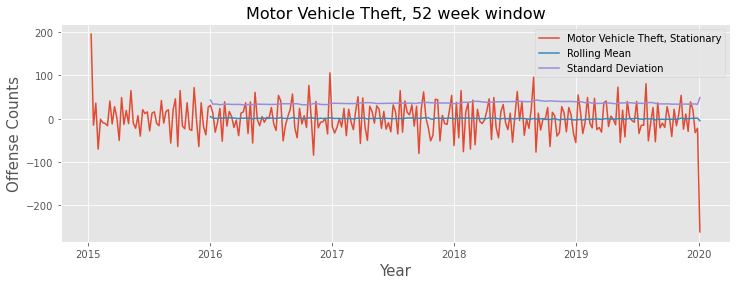

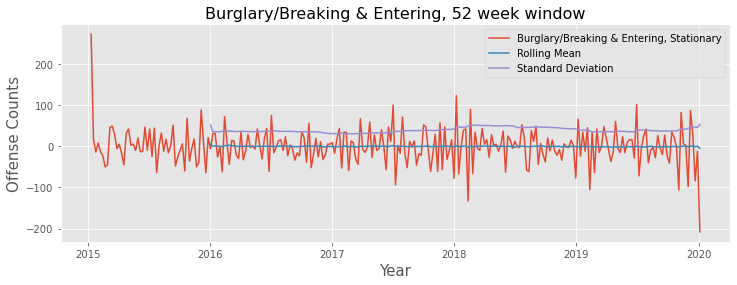

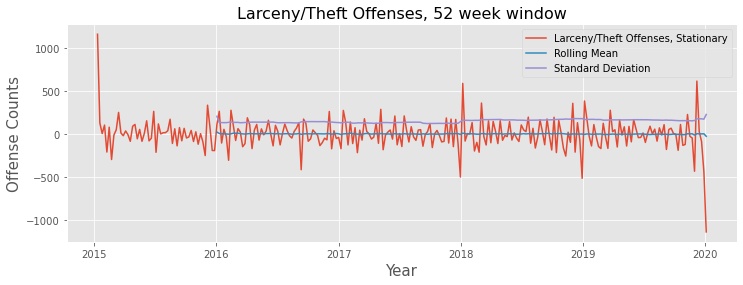

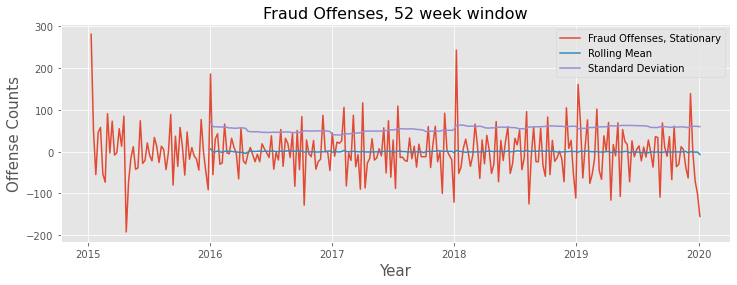

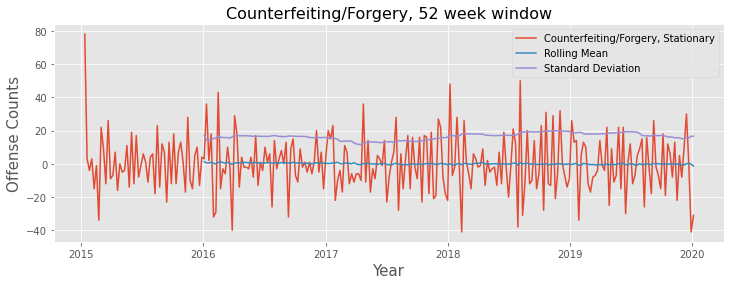

...

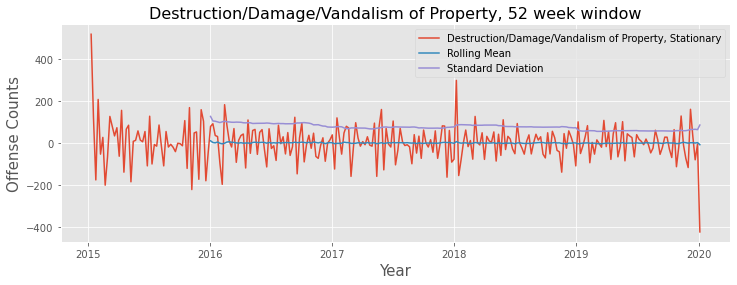

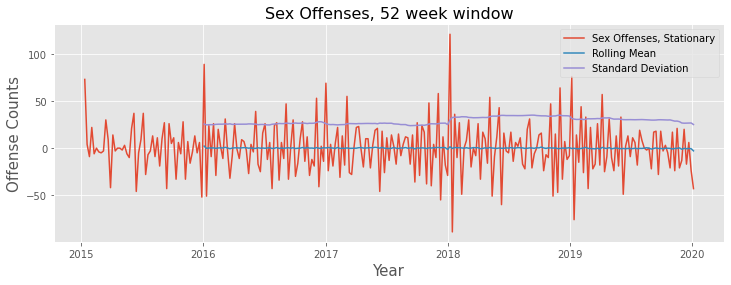

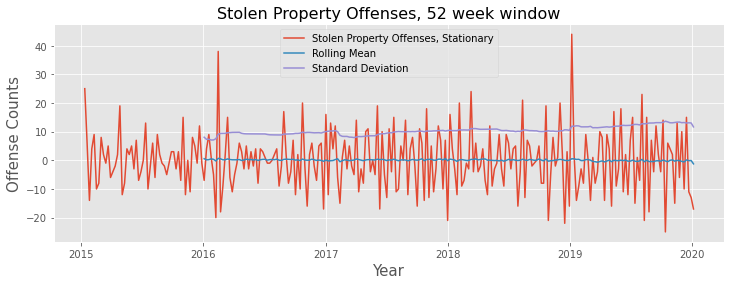

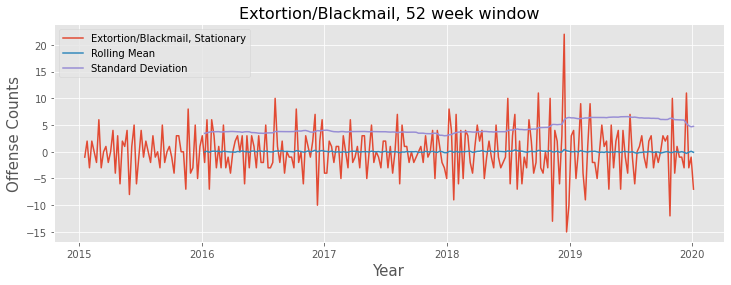

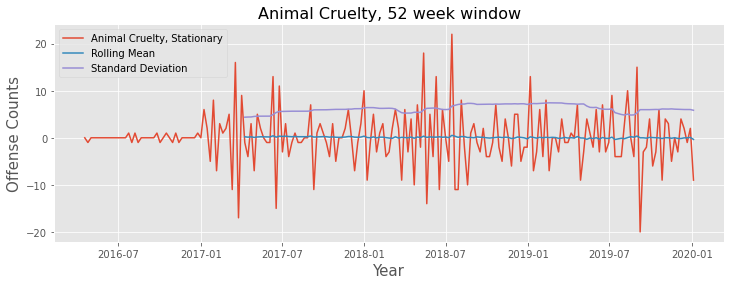

In [7]:

df_results2, ts_stationary2, ts_non_stationary_diff2=check_stationarity_multiple(ts_non_stationary_diff1, 
                                                                                  window=52, plot=True)

In [8]:
df_results2

,Crime Category,Critical Value,P-value,Lags,Observations,"Critical value, 1%","Critical value, 5%","Critical value, 10%",Stationary?
Number,,,,,,,,,
1,Motor Vehicle Theft,-6.17315,6.72911e-08,7,253,-3.45646,-2.87303,-2.57289,True
2,Burglary/Breaking & Entering,-12.8616,5.0966e-24,2,258,-3.45595,-2.87281,-2.57277,True
3,Larceny/Theft Offenses,-11.1342,3.22534e-20,3,257,-3.45605,-2.87285,-2.5728,True
4,Fraud Offenses,-6.08654,1.06105e-07,15,245,-3.45733,-2.87341,-2.5731,True
5,Counterfeiting/Forgery,-10.6294,5.26217e-19,5,255,-3.45626,-2.87294,-2.57285,True
6,Assault Offenses,-10.7223,3.12766e-19,2,258,-3.45595,-2.87281,-2.57277,True
7,Destruction/Damage/Vandalism of Property,-12.0371,2.78743e-22,3,257,-3.45605,-2.87285,-2.5728,True
8,Sex Offenses,-6.52936,9.95943e-09,11,249,-3.45689,-2.87322,-2.57299,True
9,Stolen Property Offenses,-10.3858,2.08208e-18,5,255,-3.45626,-2.87294,-2.57285,True


<br><br><span style="font-size:1.2em; background:lightgreen">All **11** time-series got stationarized by the first dfferencing </span><br><br>
<span style="font-size:1.2em;">Theere are two separate dictionaries for offenses categories: one with 12 original time-series, that were stationary from the get go and another one with 11 time-series that were pre-processed with the first differencing.</span><br><br>
<span style="font-size:1.2em; background:lightblue">The next step is to explore ACFs and PACFs of the timeframe and make a decision on the pdq and PDQs orders.</span><br><br>


    

#### Exploring ACFs and PACFs of the originally stationary time-series

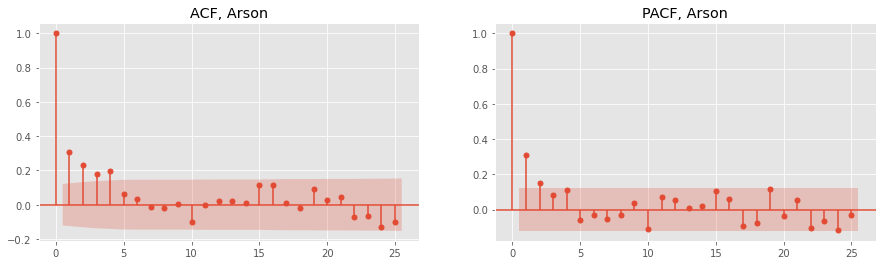

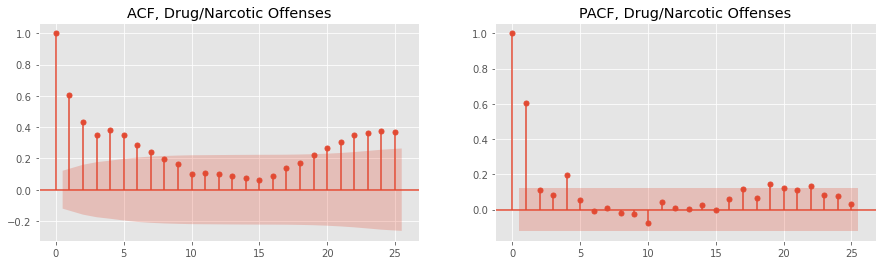

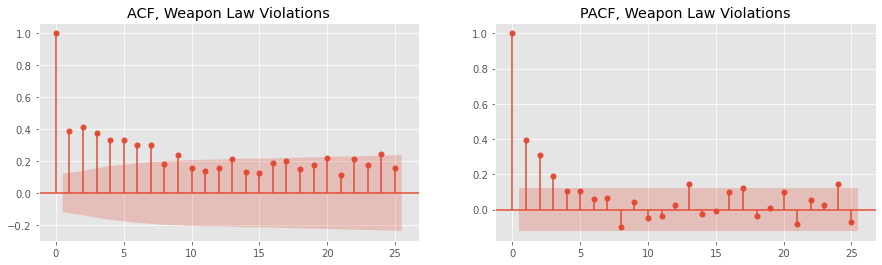

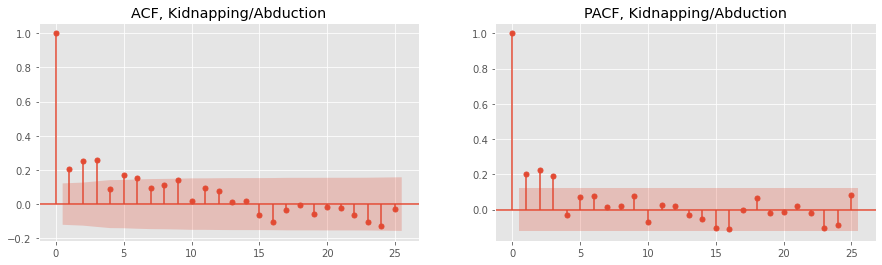

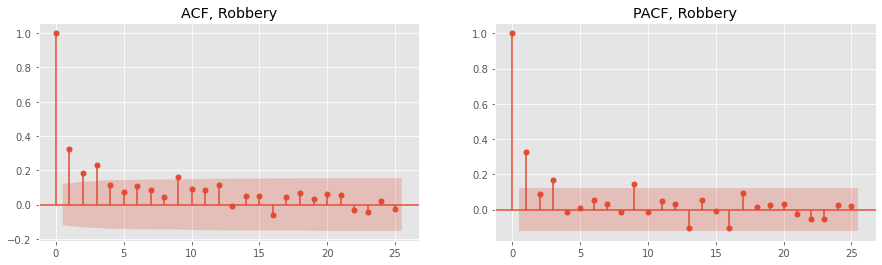

...

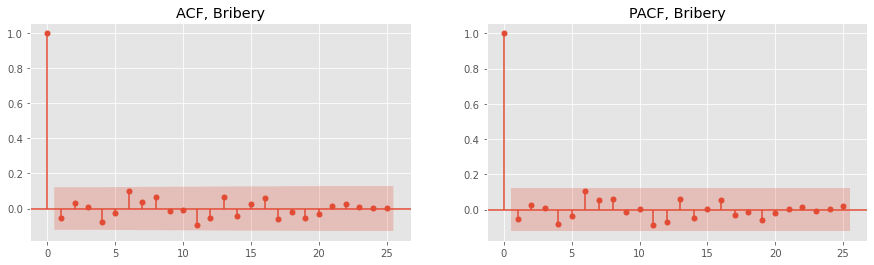

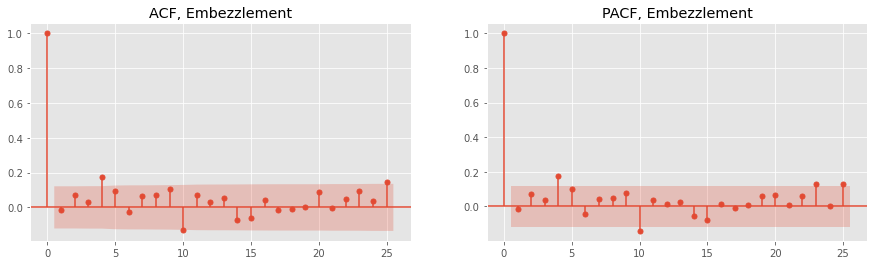

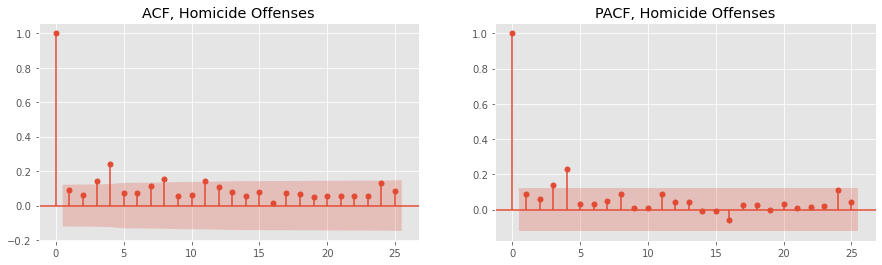

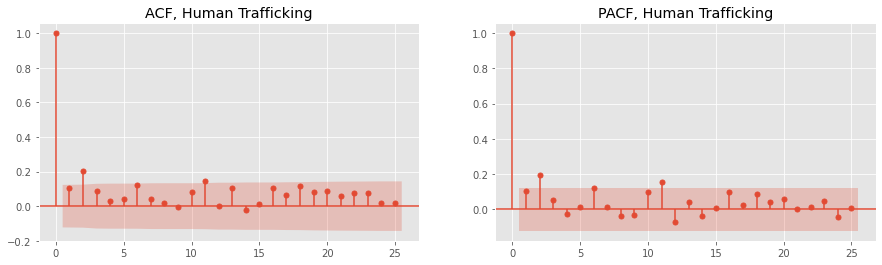

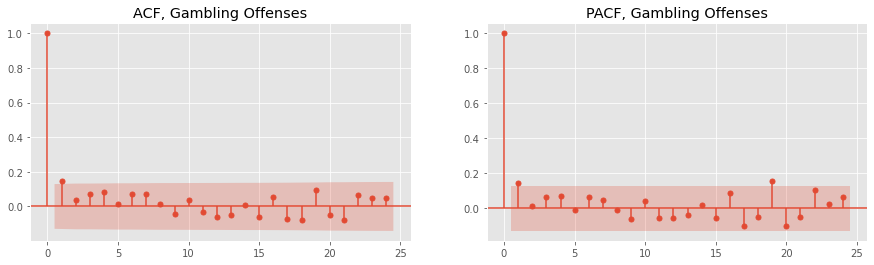

In [9]:
ACF_PACF_multiple(ts_stationary1);

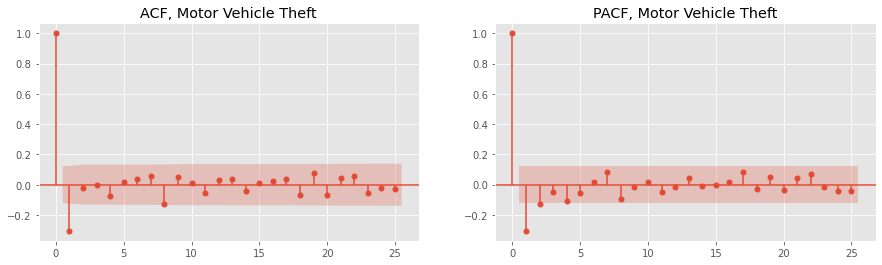

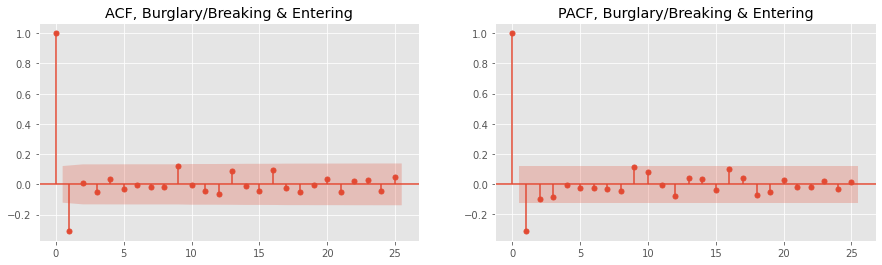

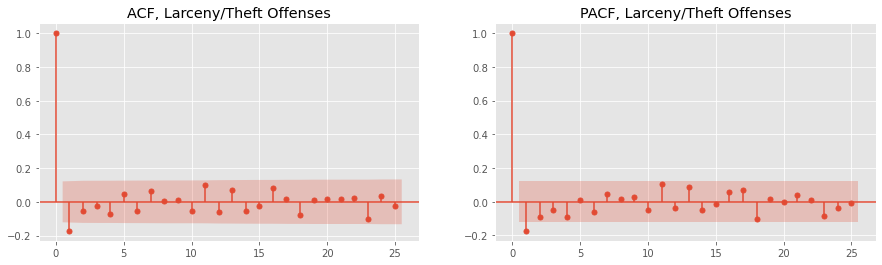

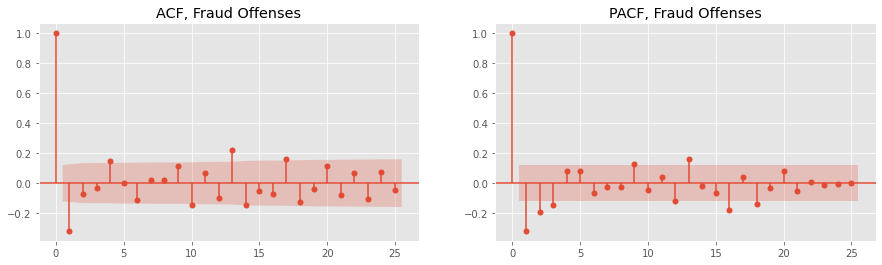

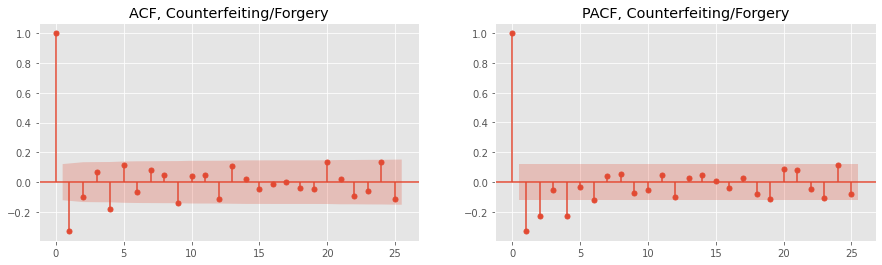

...

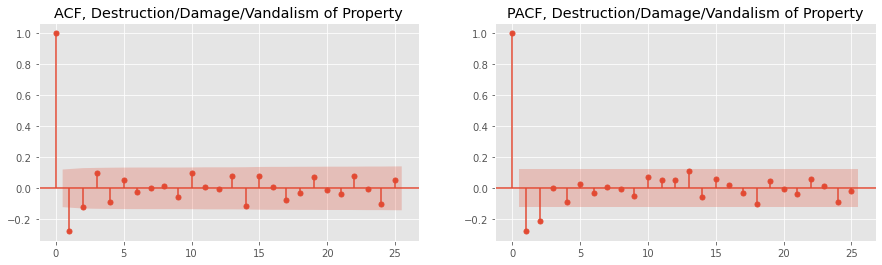

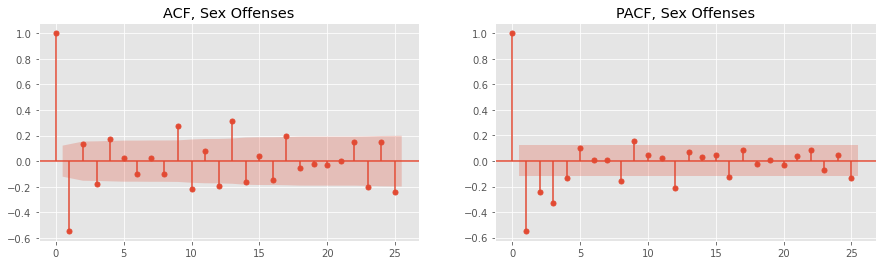

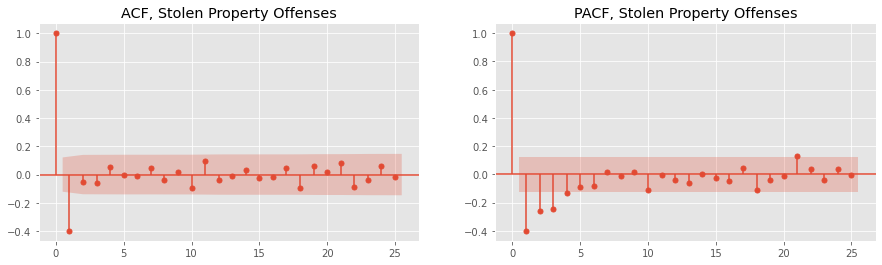

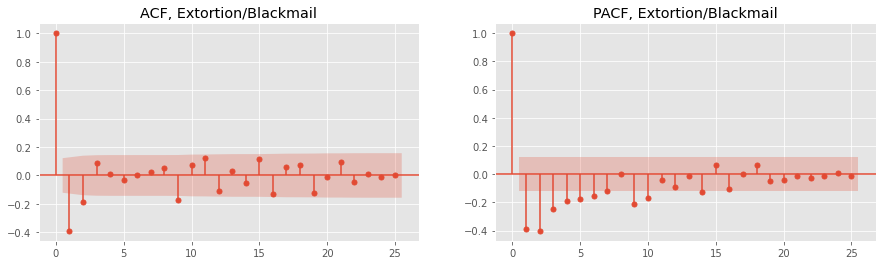

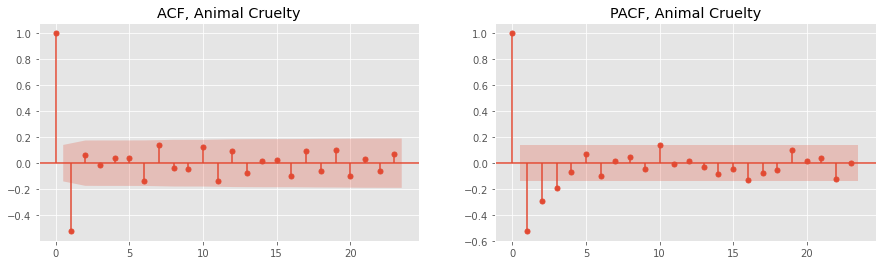

In [10]:
ACF_PACF_multiple(ts_stationary2);

### Auto ARIMA for multiple categories of offenses

In [11]:
# RESULTS = {}
# for crime, ts  in  TS_crime_category.items():
#     crime_categories_results = {}

#     # Splittting it up
#     print('==='*20)
#     print('GRIDSEARCHING FOR {}'.format(crime)) 
#     train_size = round(len(ts) * 0.90)
#     ts_train, ts_test = ts[:train_size], ts[train_size:]


#     predictions_fig=display_figure_w_TSs(ts_train, ts_test, 'Training set', 'Test set', 
#                                              'Training and Test Sets for Modeling {}'.format(crime), limit_=False)


#     #### Gridsearch

#     auto_model_train = pm.auto_arima(ts_train,
#                             start_p=0,start_q=0, d=1,
#                             start_P=1, start_Q=1, D=1,
#                             max_p=2, max_q=2,
#                             max_P=2, max_Q=2,
#                             m=52, maxiter=150,
#                             trace=False,verbose=True)

#     ## Fit SARIMAX with best parmas and compare forecast vs test
#     best_model = tsa.SARIMAX(ts_train,order=auto_model_train.order,
#                                 seasonal_order = auto_model_train.seasonal_order,
#                                 enforce_invertibility=False).fit()

#     ## Use diagnostics
#     diagnostics(best_model)


#     predictions_fig=predictions_testset(ts_train, ts_test, best_model)


#     print('\t-FINAL MODEL:')

#     final_model = tsa.SARIMAX(ts,order=auto_model_train.order,
#                         seasonal_order = auto_model_train.seasonal_order,
#                         enforce_invertibility=False).fit()

#     ## Plot forecast
#     forecast_fig=plot_predictions(ts, final_model, 'Forecast For Two Years Forward, {}'.format(crime),
#                                       steps=104, xmin='2015')

#     ## Fill in results and
#     crime_categories_results['final_model'] = final_model
#     crime_categories_results['predict_fig'] = predictions_fig
#     crime_categories_results['forecast_fig'] = forecast_fig

#     ## Saving results to RESULTS dict
#     RESULTS[crime] = crime_categories_results
        
#     print("\n\n")

<br><br><span style="font-size:1.2em; background:lightgreen">Several cells above and below are commented out because their runtime was very high and the original result dictionaries had been saved in the RESULTS1.pickle and RESULTS2.pickle files</span><br>

<br><br><span style="font-size:1.2em; background:pink">Two of the categories did not converge, Sex Offenses and Weapon Law Violations. The grid search for this categories need to be re-run with adjusted hyperparameters. I am adjusting maxiter parameter to 300 and adding d and D equal 0, to scan model with no differencing</span><br>
    

In [12]:
# cropped_RESULTS = {key:val for key, val in RESULTS.items() if ((key != 'Sex Offenses')&(key != 'Weapon Law Violations'))}

# cropped_RESULTS.keys()

In [13]:
# with open('data/pickled_models/RESULTS1.pickle', 'wb') as f:
#     pickle.dump(cropped_RESULTS, f)

In [14]:
# TS_crime_category_to_rerun1={}
# TS_crime_category_to_rerun1['Sex Offenses']=TS_crime_category['Sex Offenses'].copy()

# TS_crime_category_to_rerun1['Weapon Law Violations']=TS_crime_category['Weapon Law Violations'].copy()

In [15]:
# RESULTS_second_run = {}
# for crime, ts  in  TS_crime_category_to_rerun1.items():
#     crime_categories_results = {}

#     # Splittting it up
#     print('==='*20)
#     print('GRIDSEARCHING FOR {}'.format(crime)) 
#     train_size = round(len(ts) * 0.90)
#     ts_train, ts_test = ts[:train_size], ts[train_size:]


#     predictions_fig=display_figure_w_TSs(ts_train, ts_test, 'Training set', 'Test set', 
#                                              'Training and Test Sets for Modeling {}'.format(crime), limit_=False)


#     #### Gridsearch
#     auto_model_train = pm.auto_arima(ts_train,
#                             start_p=0,start_q=0, d=0,
#                             start_P=0, start_Q=0, D=0,
#                             max_p=2, max_q=2, max_d=1,
#                             max_P=2, max_Q=2, max_D=1,
#                             m=52, maxiter=300,
#                             trace=False,verbose=True)
     

#     ## Fit SARIMAX with best parmas and compare forecast vs test
#     best_model = tsa.SARIMAX(ts_train,order=auto_model_train.order,
#                                 seasonal_order = auto_model_train.seasonal_order,
#                                 enforce_invertibility=False).fit()


#     ## Use diagnostics
#     diagnostics(best_model)

#     # Plot prediction for the test dataset
#     predictions_fig=predictions_testset(ts_train, ts_test, best_model)


#     print('\t-FINAL MODEL:')

#     final_model = tsa.SARIMAX(ts,order=auto_model_train.order,
#                         seasonal_order = auto_model_train.seasonal_order,
#                         enforce_invertibility=False).fit()

#     ## Plot forecast
#     forecast_fig=plot_predictions(ts, final_model, 'Forecast For Two Years Forward, {}'.format(crime),
#                                       steps=104, xmin='2015')

#     ## Fill in results and
#     crime_categories_results['final_model'] = final_model
#     crime_categories_results['predict_fig'] = predictions_fig
#     crime_categories_results['forecast_fig'] = forecast_fig

#     ## Saving results to RESULTS dict
#     RESULTS_second_run[crime] = crime_categories_results
        
#     print("\n\n")

In [16]:
# with open('data/pickled_models/RESULTS2.pickle', 'wb') as f:
#     pickle.dump(RESULTS_second_run, f)

********************************************************************
OFFENSE CATEGORY: Motor Vehicle Theft

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                 Motor Vehicle Theft   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood               -1087.379
Date:                             Thu, 29 Jul 2021   AIC                           2182.757
Time:                                     00:40:38   BIC                           2196.126
Sample:                                 01-04-2015   HQIC                          2188.162
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7592      0.059    -12.913      0.000      -0.874      -0.644
ar.S.L52      -0.5590      0.088     -6.333      0.000      -0.732      -0.386
ar.S.L104     -0.2983      0.128     -2.327      0.020      -0.550      -0.047
sigma2      1748.7905     94.113     18.582      0.000    1564.332    1933.249
===================================================================================
Ljung-Box (L1) (Q):                   2.41   Jarque-Bera (JB):               666.52
Prob(Q):                              0.12   Prob(JB):                         0.00
Heteroskedasticity (H):               1.53   Skew:                            -1.56
Prob(H) (two-sided):                  0.08   Kurtosis:                        11.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

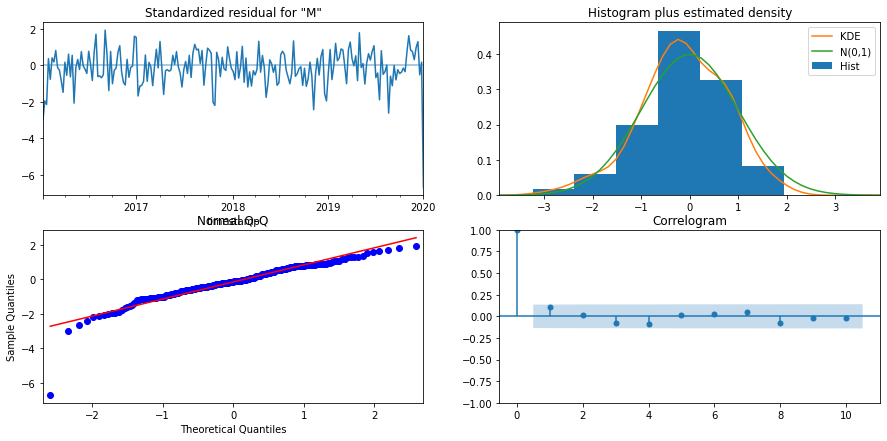


PREDICTION FOR TRAIN AND TEST sets: 



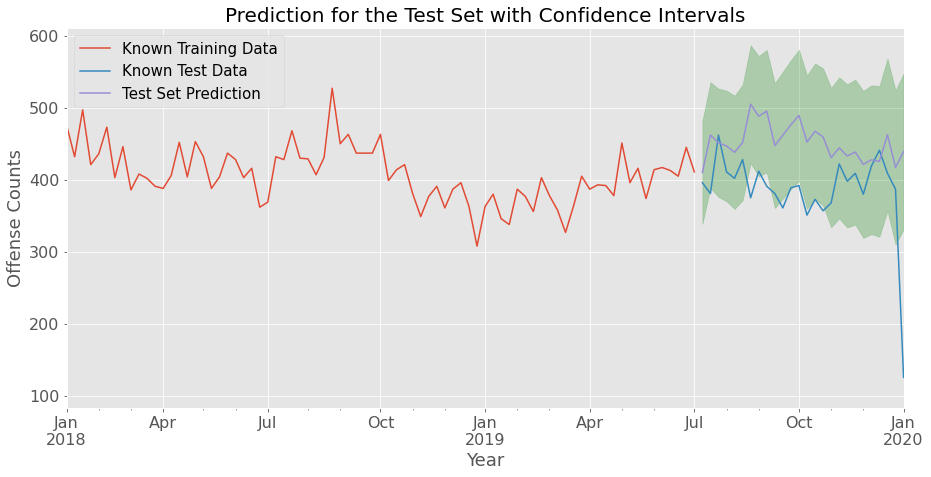


FORECAST: 



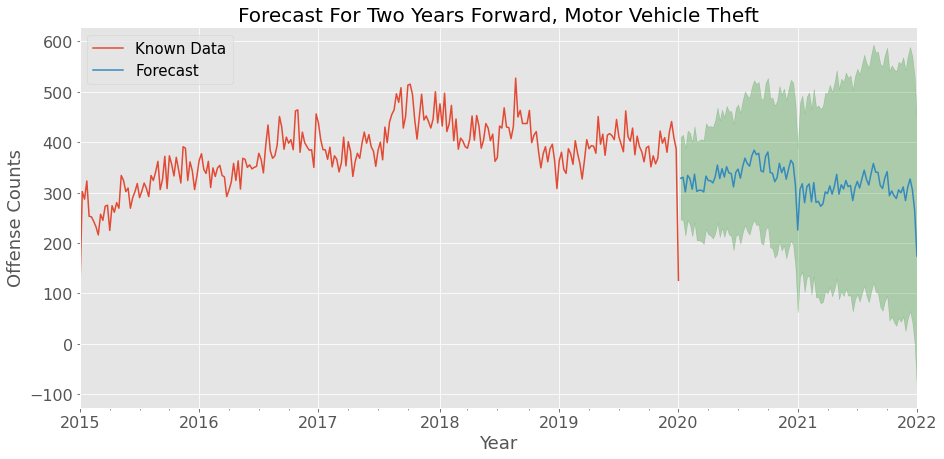

********************************************************************
OFFENSE CATEGORY: Burglary/Breaking & Entering

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:        Burglary/Breaking & Entering   No. Observations:                  262
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 52)   Log Likelihood               -1078.874
Date:                             Thu, 29 Jul 2021   AIC                           2167.749
Time:                                     00:40:38   BIC                           2184.460
Sample:                                 01-04-2015   HQIC                          2174.505
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7629      0.073    -10.485      0.000      -0.906      -0.620
ma.L2         -0.1181      0.074     -1.594      0.111      -0.263       0.027
ar.S.L52      -0.4278      0.080     -5.334      0.000      -0.585      -0.271
ar.S.L104     -0.4115      0.113     -3.644      0.000      -0.633      -0.190
sigma2      1577.3598    156.099     10.105      0.000    1271.411    1883.309
===================================================================================
Ljung-Box (L1) (Q):                   0.63   Jarque-Bera (JB):               291.53
Prob(Q):                              0.43   Prob(JB):                         0.00
Heteroskedasticity (H):               0.99   Skew:                            -1.27
Prob(H) (two-sided):                  0.96   Kurtosis:                         8.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

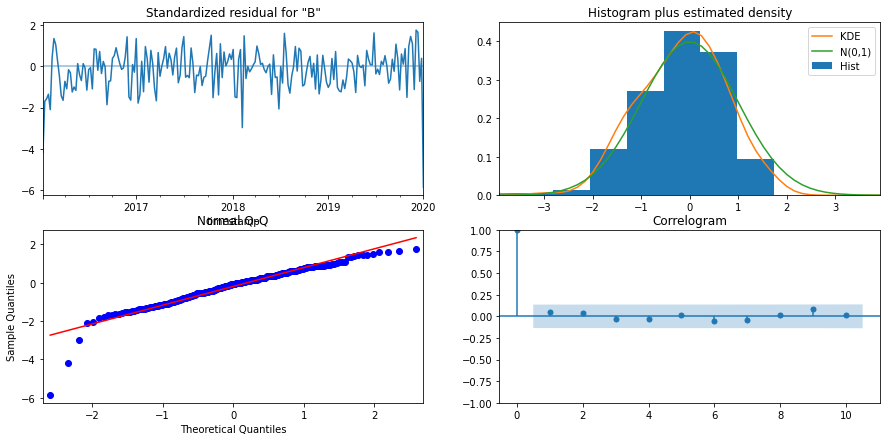


PREDICTION FOR TRAIN AND TEST sets: 



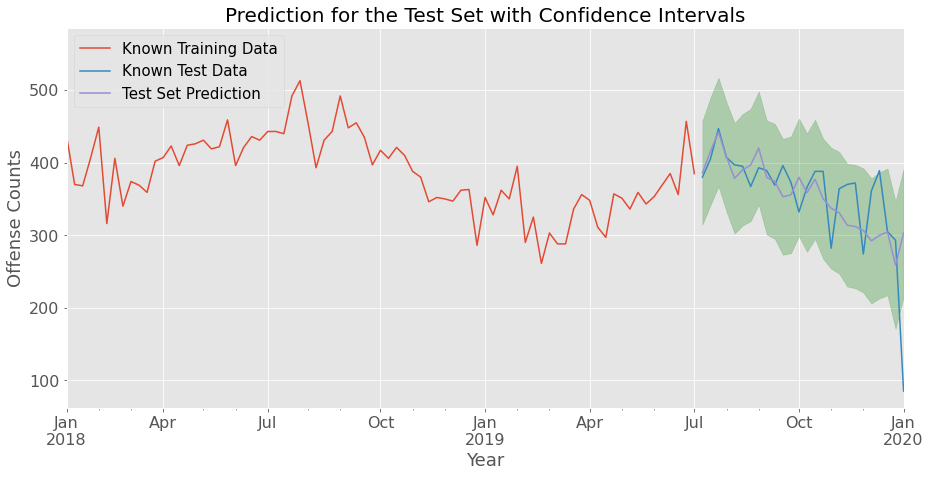


FORECAST: 



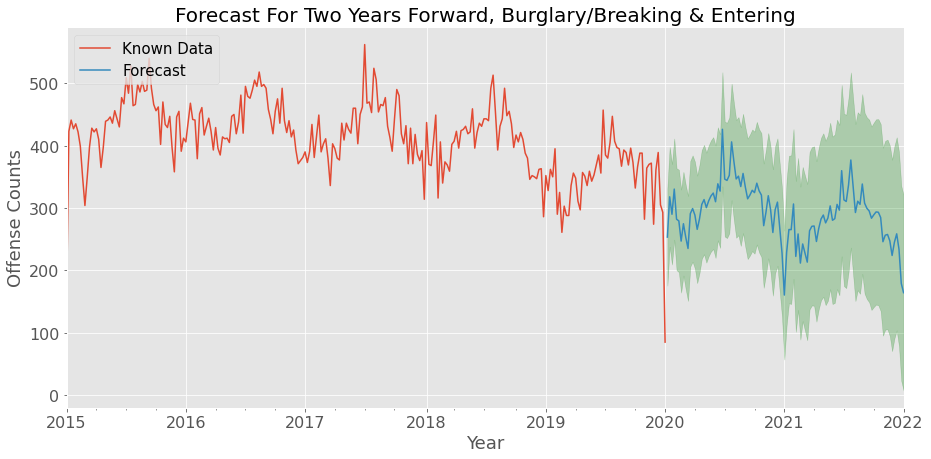

********************************************************************
OFFENSE CATEGORY: Larceny/Theft Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Larceny/Theft Offenses   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood               -1381.281
Date:                             Thu, 29 Jul 2021   AIC                           2770.561
Time:                                     00:40:39   BIC                           2783.930
Sample:                                 01-04-2015   HQIC                          2775.966
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8804      0.043    -20.302      0.000      -0.965      -0.795
ar.S.L52      -0.5155      0.091     -5.688      0.000      -0.693      -0.338
ar.S.L104     -0.3554      0.147     -2.411      0.016      -0.644      -0.066
sigma2      2.886e+04   2762.625     10.446      0.000    2.34e+04    3.43e+04
===================================================================================
Ljung-Box (L1) (Q):                   3.34   Jarque-Bera (JB):              2487.91
Prob(Q):                              0.07   Prob(JB):                         0.00
Heteroskedasticity (H):               1.44   Skew:                            -2.43
Prob(H) (two-sided):                  0.13   Kurtosis:                        19.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

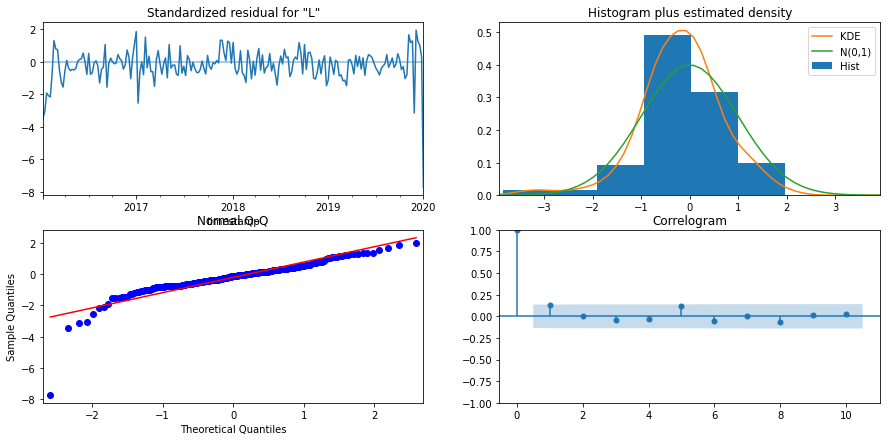


PREDICTION FOR TRAIN AND TEST sets: 



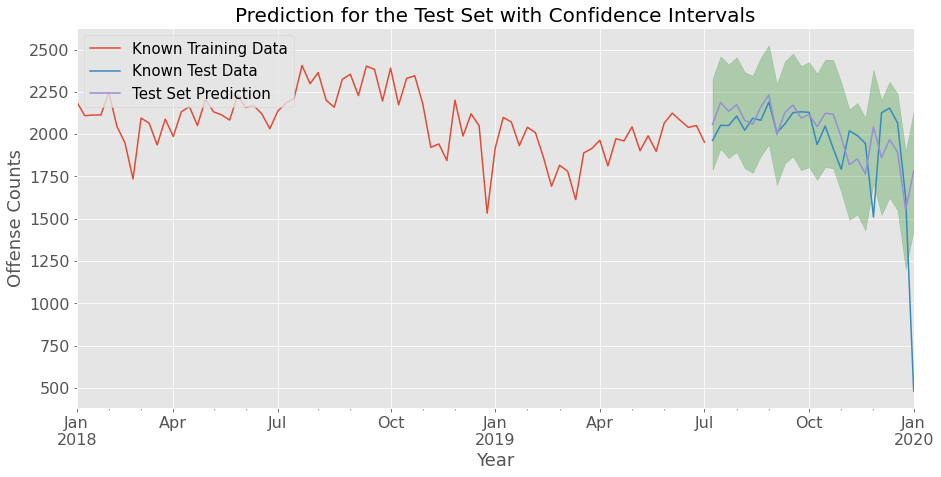


FORECAST: 



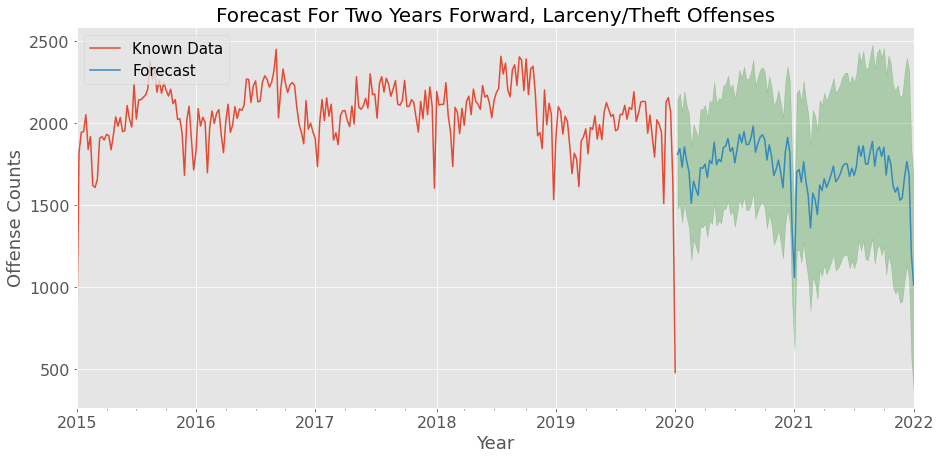

********************************************************************
OFFENSE CATEGORY: Fraud Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                      Fraud Offenses   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood               -1138.743
Date:                             Thu, 29 Jul 2021   AIC                           2285.485
Time:                                     00:40:40   BIC                           2298.854
Sample:                                 01-04-2015   HQIC                          2290.890
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6526      0.050    -12.950      0.000      -0.751      -0.554
ar.S.L52      -0.4171      0.073     -5.698      0.000      -0.561      -0.274
ar.S.L104     -0.4076      0.072     -5.645      0.000      -0.549      -0.266
sigma2      2819.6525    226.429     12.453      0.000    2375.859    3263.446
===================================================================================
Ljung-Box (L1) (Q):                   2.22   Jarque-Bera (JB):               258.78
Prob(Q):                              0.14   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                            -1.23
Prob(H) (two-sided):                  0.47   Kurtosis:                         7.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

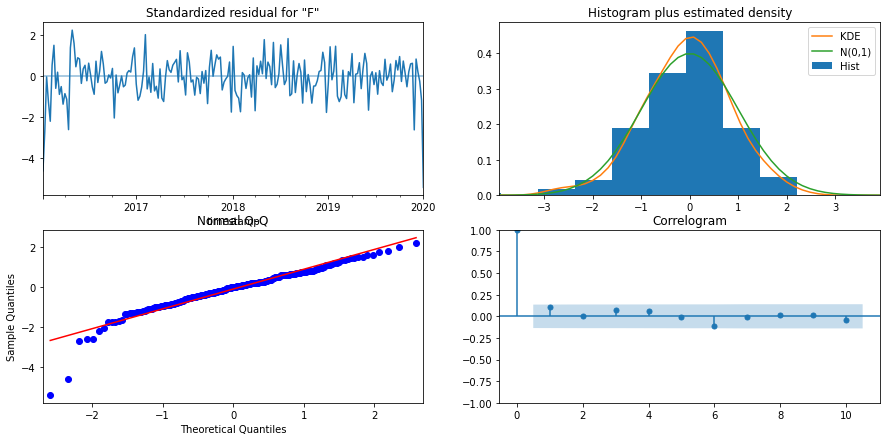


PREDICTION FOR TRAIN AND TEST sets: 



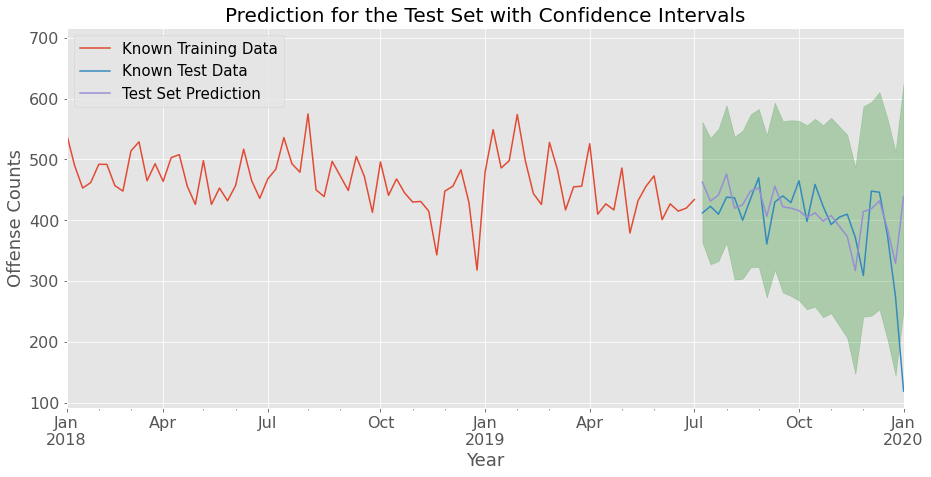


FORECAST: 



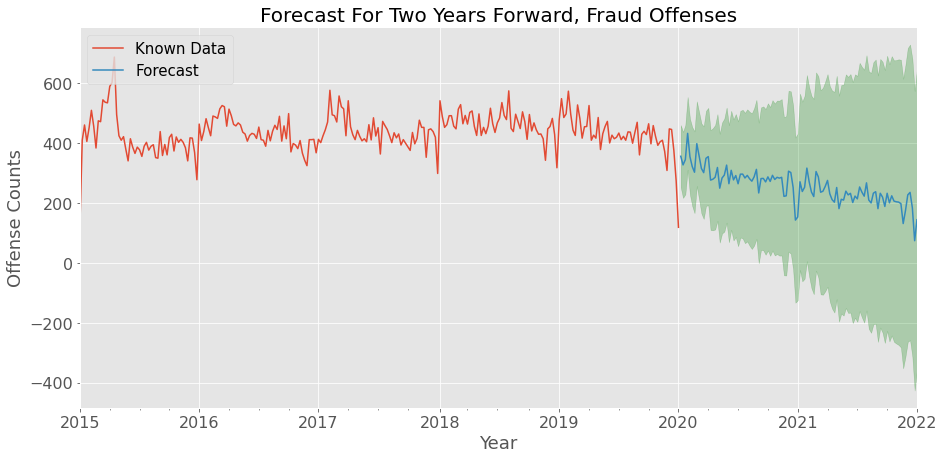

********************************************************************
OFFENSE CATEGORY: Counterfeiting/Forgery

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Counterfeiting/Forgery   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood                -871.182
Date:                             Thu, 29 Jul 2021   AIC                           1750.364
Time:                                     00:40:41   BIC                           1763.734
Sample:                                 01-04-2015   HQIC                          1755.770
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8404      0.041    -20.468      0.000      -0.921      -0.760
ar.S.L52      -0.5933      0.089     -6.697      0.000      -0.767      -0.420
ar.S.L104     -0.3472      0.097     -3.563      0.000      -0.538      -0.156
sigma2       216.0399     16.310     13.246      0.000     184.073     248.007
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                21.25
Prob(Q):                              0.74   Prob(JB):                         0.00
Heteroskedasticity (H):               1.13   Skew:                            -0.31
Prob(H) (two-sided):                  0.61   Kurtosis:                         4.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

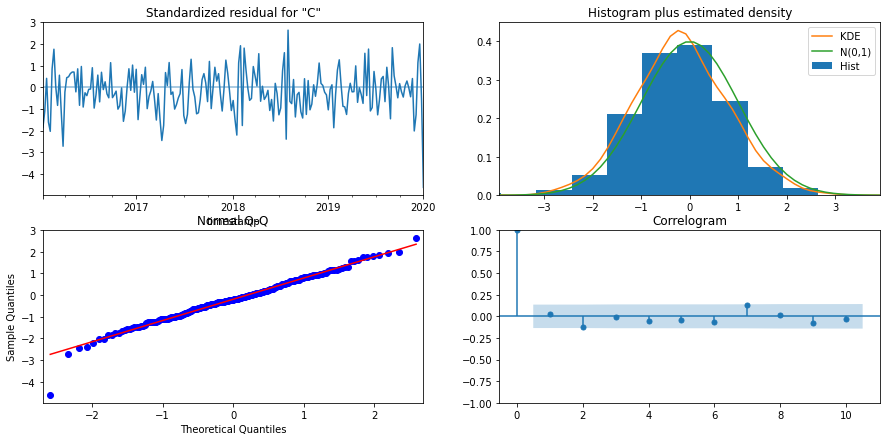


PREDICTION FOR TRAIN AND TEST sets: 



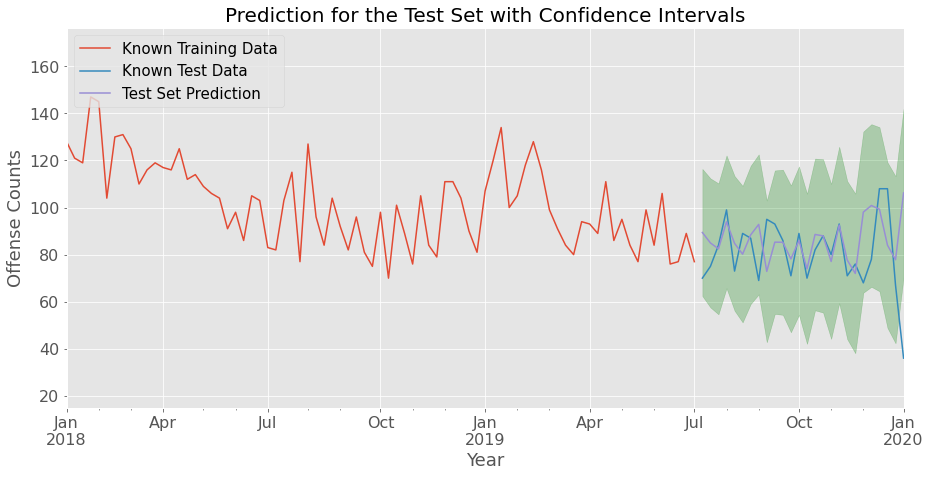


FORECAST: 



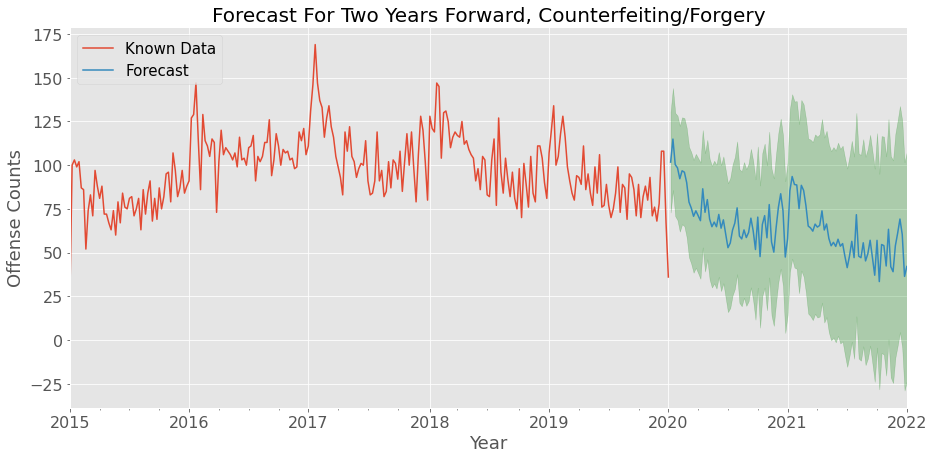

********************************************************************
OFFENSE CATEGORY: Assault Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    Assault Offenses   No. Observations:                  262
Model:             SARIMAX(2, 1, 1)x(2, 1, [], 52)   Log Likelihood               -1207.539
Date:                             Thu, 29 Jul 2021   AIC                           2427.078
Time:                                     00:40:41   BIC                           2447.132
Sample:                                 01-04-2015   HQIC                          2435.186
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1210      0.109      1.108      0.268      -0.093       0.335
ar.L2          0.1233      0.111      1.113      0.266      -0.094       0.340
ma.L1         -0.9078      0.063    -14.431      0.000      -1.031      -0.785
ar.S.L52      -0.4029      0.101     -3.985      0.000      -0.601      -0.205
ar.S.L104     -0.3213      0.119     -2.700      0.007      -0.555      -0.088
sigma2      5617.1717    295.661     18.999      0.000    5037.687    6196.656
===================================================================================
Ljung-Box (L1) (Q):                   0.50   Jarque-Bera (JB):              3272.61
Prob(Q):                              0.48   Prob(JB):                         0.00
Heteroskedasticity (H):               1.53   Skew:                            -2.49
Prob(H) (two-sided):                  0.08   Kurtosis:                        21.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

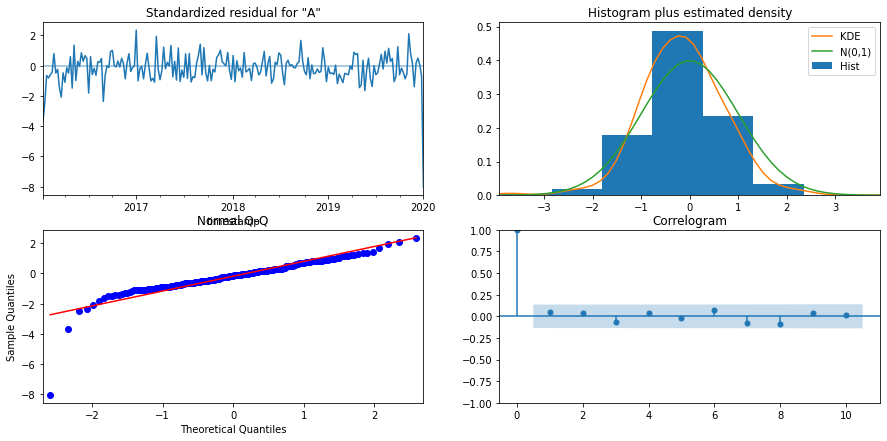


PREDICTION FOR TRAIN AND TEST sets: 



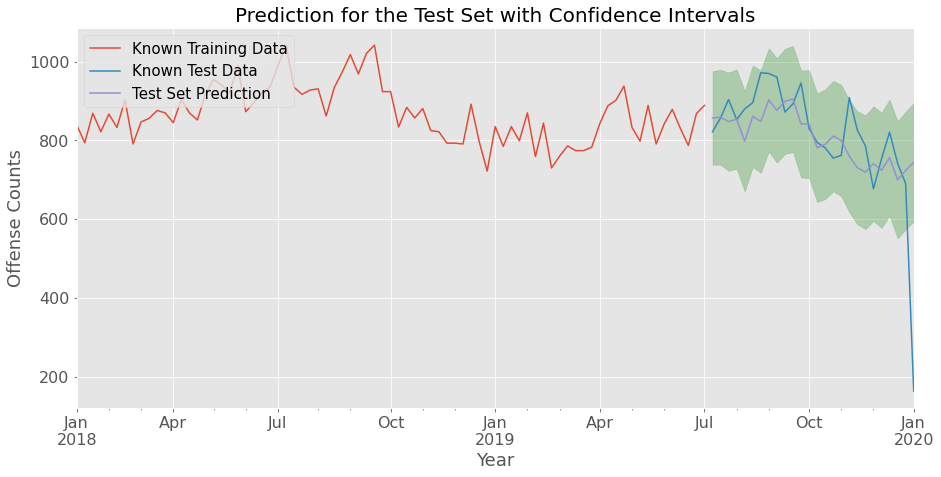


FORECAST: 



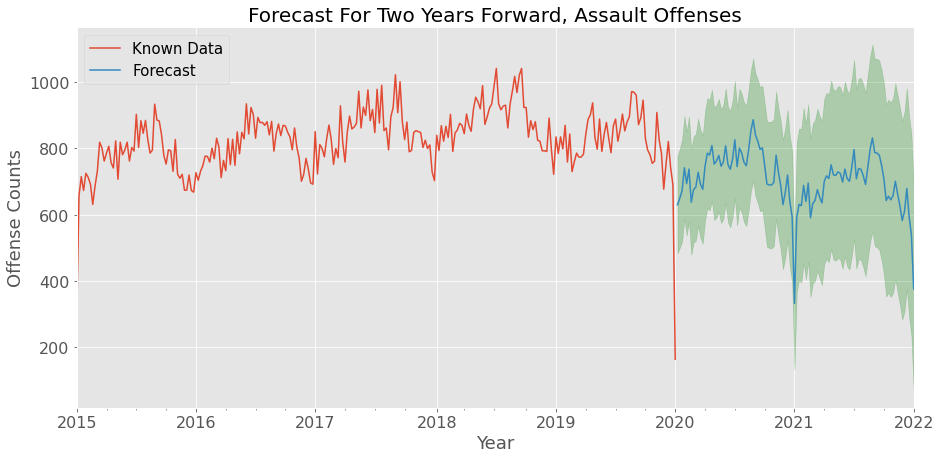

********************************************************************
OFFENSE CATEGORY: Destruction/Damage/Vandalism of Property

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                          SARIMAX Results                                           
====================================================================================================
Dep. Variable:     Destruction/Damage/Vandalism of Property   No. Observations:                  262
Model:                      SARIMAX(1, 1, 2)x(2, 1, [], 52)   Log Likelihood               -1240.293
Date:                                      Thu, 29 Jul 2021   AIC                           2492.586
Time:                                              00:40:42   BIC                           2512.640
Sample:                                          01-04-2015   HQIC                          2500.694
                                               - 01-05-2020                                         
Covariance Type:                                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4574      0.234     -1.954      0.051      -0.916       0.001
ma.L1         -0.2473      0.229     -1.078      0.281      -0.697       0.202
ma.L2         -0.6048      0.200     -3.030      0.002      -0.996      -0.214
ar.S.L52      -0.5324      0.084     -6.323      0.000      -0.697      -0.367
ar.S.L104     -0.3604      0.092     -3.904      0.000      -0.541      -0.179
sigma2      7448.8908    862.754      8.634      0.000    5757.925    9139.857
===================================================================================
Ljung-Box (L1) (Q):                   0.98   Jarque-Bera (JB):                78.67
Prob(Q):                              0.32   Prob(JB):                         0.00
Heteroskedasticity (H):               0.67   Skew:                            -0.88
Prob(H) (two-sided):                  0.10   Kurtosis:                         5.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

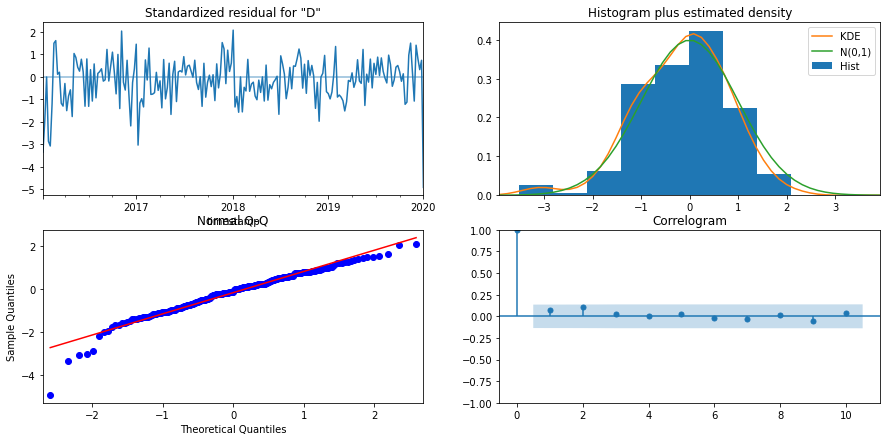


PREDICTION FOR TRAIN AND TEST sets: 



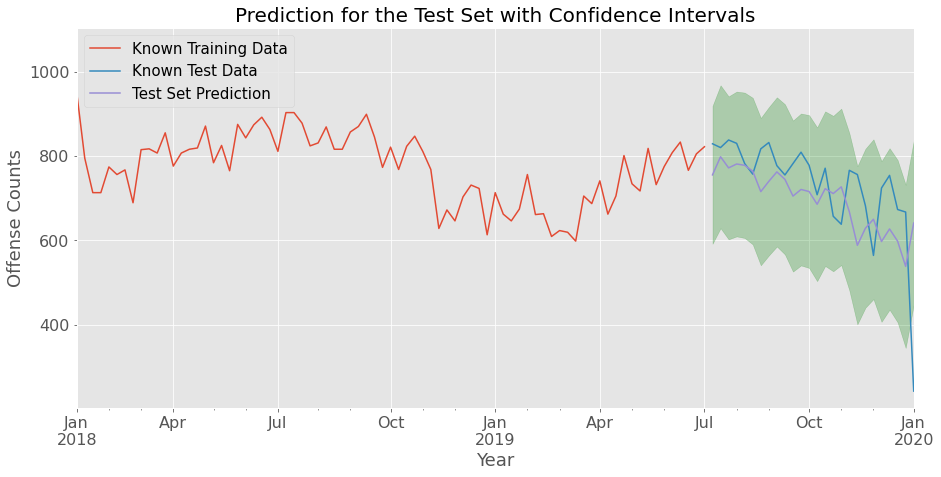


FORECAST: 



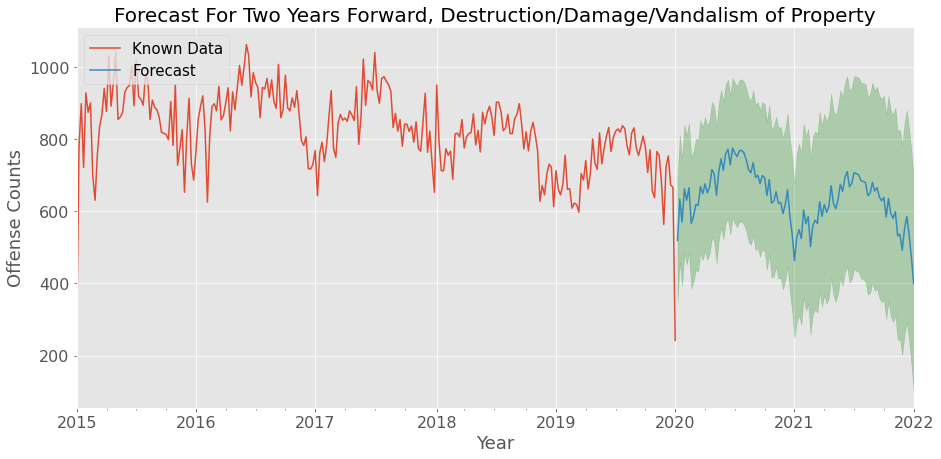

********************************************************************
OFFENSE CATEGORY: Arson

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Arson   No. Observations:                  262
Model:             SARIMAX(1, 1, 1)x(2, 1, [], 52)   Log Likelihood                -722.935
Date:                             Thu, 29 Jul 2021   AIC                           1455.870
Time:                                     00:40:43   BIC                           1472.582
Sample:                                 01-04-2015   HQIC                          1462.627
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1322      0.067      1.974      0.048       0.001       0.264
ma.L1         -0.9588      0.028    -33.989      0.000      -1.014      -0.904
ar.S.L52      -0.5102      0.070     -7.311      0.000      -0.647      -0.373
ar.S.L104     -0.3924      0.087     -4.493      0.000      -0.564      -0.221
sigma2        51.9199      3.810     13.626      0.000      44.452      59.388
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                47.51
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                             0.57
Prob(H) (two-sided):                  0.86   Kurtosis:                         5.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

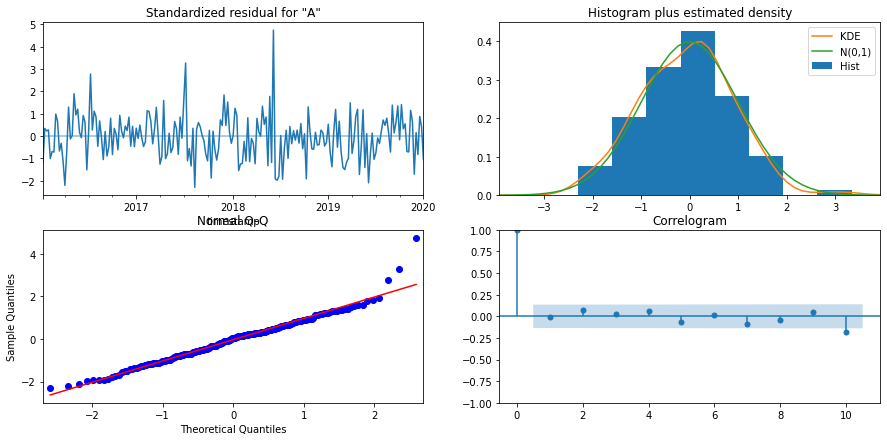


PREDICTION FOR TRAIN AND TEST sets: 



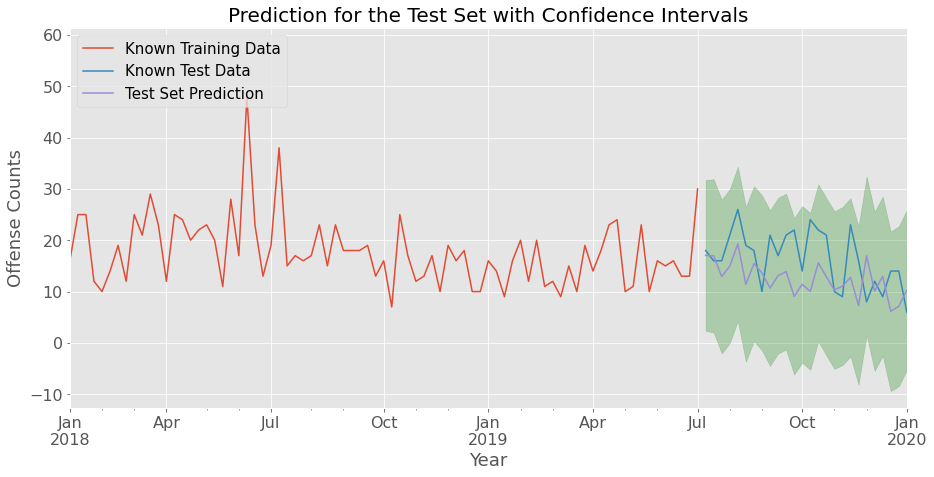


FORECAST: 



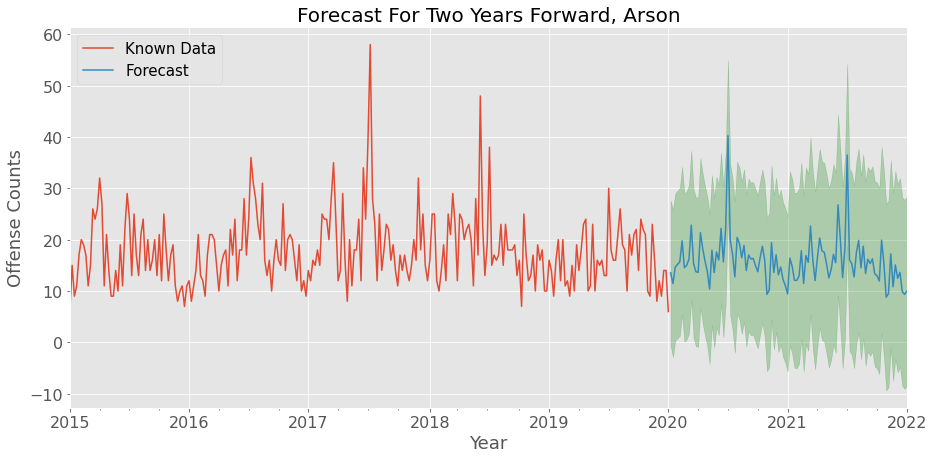

********************************************************************
OFFENSE CATEGORY: Drug/Narcotic Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Drug/Narcotic Offenses   No. Observations:                  262
Model:             SARIMAX(1, 1, 1)x(2, 1, [], 52)   Log Likelihood               -1184.394
Date:                             Thu, 29 Jul 2021   AIC                           2378.788
Time:                                     00:40:44   BIC                           2395.500
Sample:                                 01-04-2015   HQIC                          2385.545
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1509      0.076      1.994      0.046       0.003       0.299
ma.L1         -0.8906      0.047    -18.944      0.000      -0.983      -0.798
ar.S.L52      -0.4894      0.099     -4.934      0.000      -0.684      -0.295
ar.S.L104     -0.2756      0.104     -2.642      0.008      -0.480      -0.071
sigma2      4502.3816    326.682     13.782      0.000    3862.097    5142.666
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):               162.75
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               1.36   Skew:                            -0.99
Prob(H) (two-sided):                  0.20   Kurtosis:                         6.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

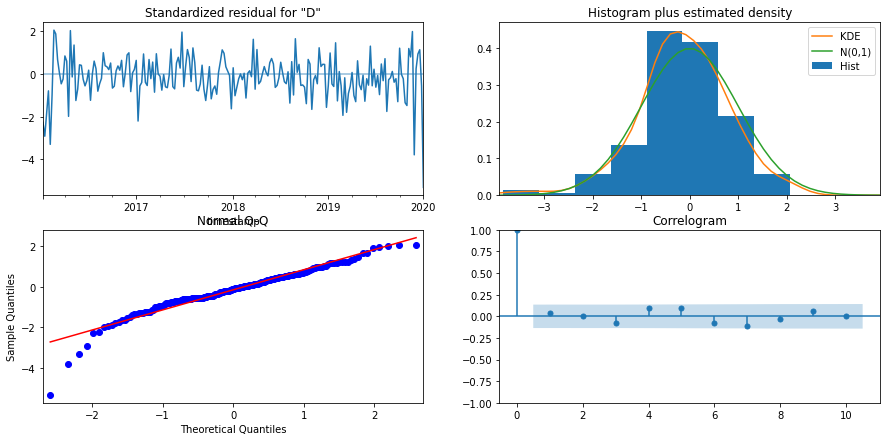


PREDICTION FOR TRAIN AND TEST sets: 



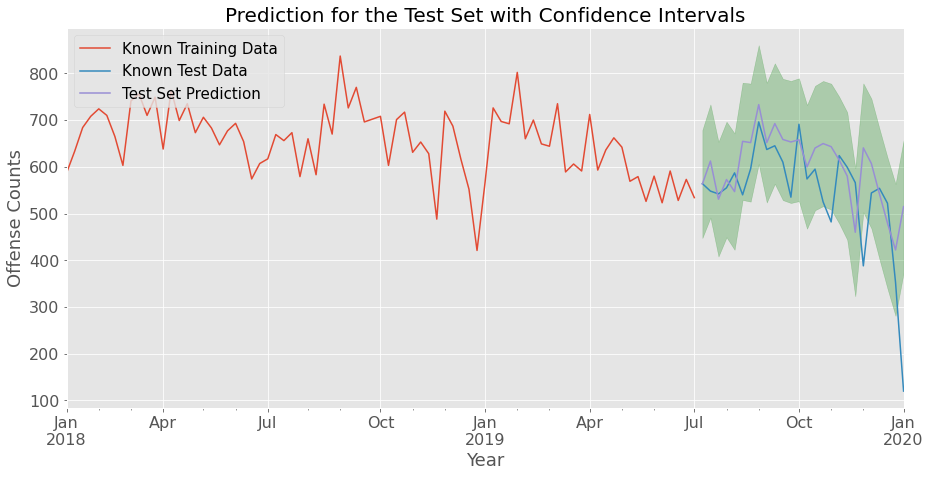


FORECAST: 



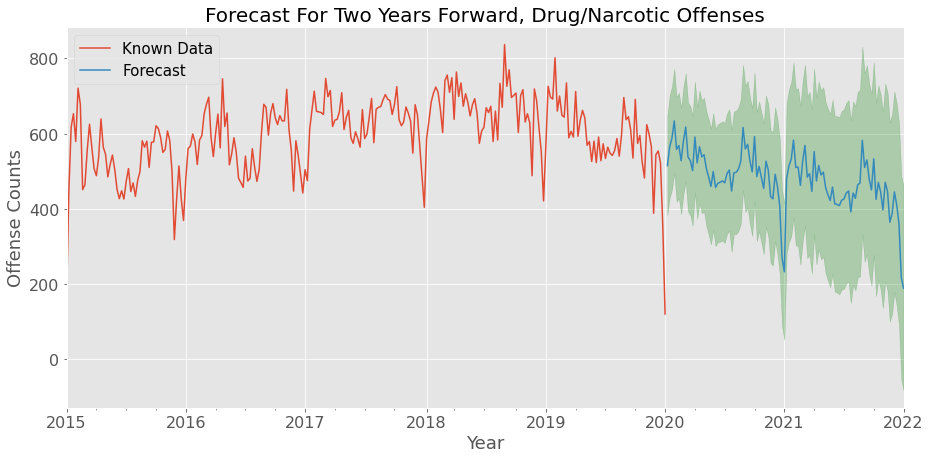

********************************************************************
OFFENSE CATEGORY: Stolen Property Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:            Stolen Property Offenses   No. Observations:                  262
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 52)   Log Likelihood                -787.419
Date:                             Thu, 29 Jul 2021   AIC                           1584.838
Time:                                     00:40:45   BIC                           1601.550
Sample:                                 01-04-2015   HQIC                          1591.595
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7840      0.065    -11.977      0.000      -0.912      -0.656
ma.L2         -0.0757      0.068     -1.116      0.264      -0.209       0.057
ar.S.L52      -0.7599      0.069    -11.050      0.000      -0.895      -0.625
ar.S.L104     -0.4050      0.080     -5.093      0.000      -0.561      -0.249
sigma2        91.4605      9.984      9.161      0.000      71.892     111.029
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 0.86
Prob(Q):                              0.82   Prob(JB):                         0.65
Heteroskedasticity (H):               1.93   Skew:                            -0.10
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

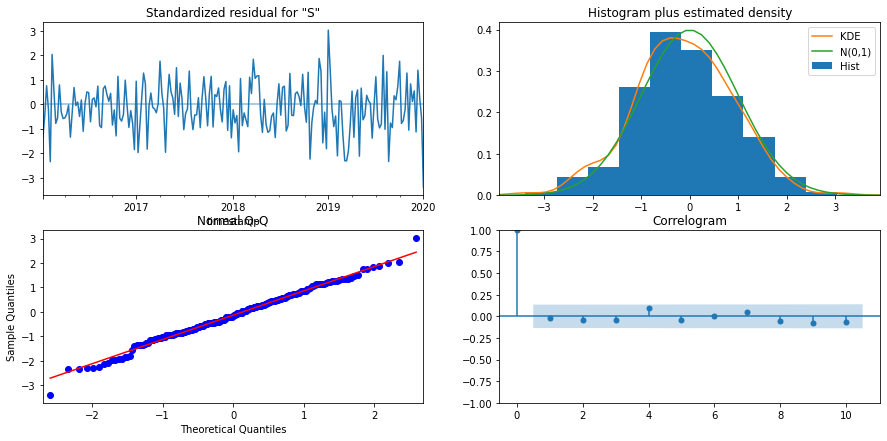


PREDICTION FOR TRAIN AND TEST sets: 



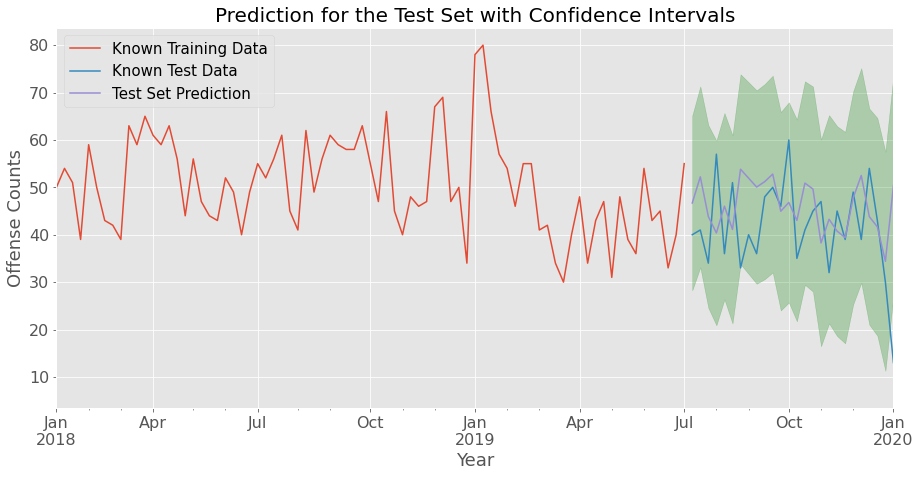


FORECAST: 



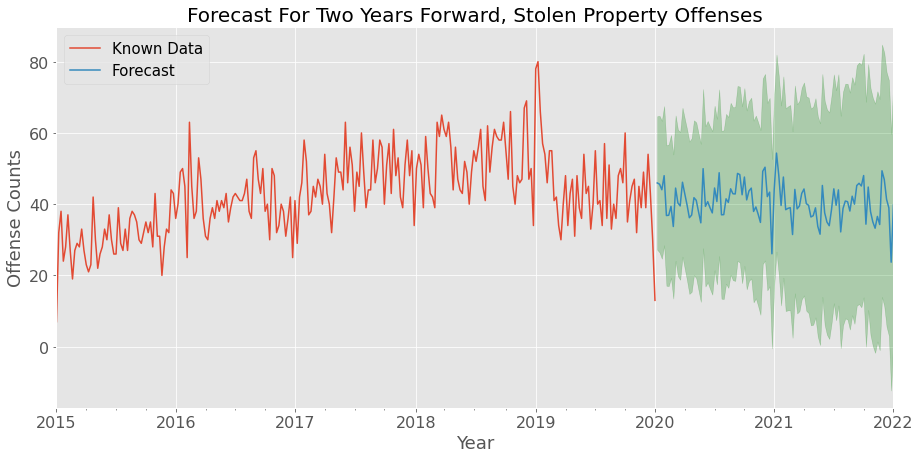

********************************************************************
OFFENSE CATEGORY: Kidnapping/Abduction

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                Kidnapping/Abduction   No. Observations:                  262
Model:             SARIMAX(1, 1, 1)x(2, 1, [], 52)   Log Likelihood                -726.762
Date:                             Thu, 29 Jul 2021   AIC                           1463.525
Time:                                     00:40:45   BIC                           1480.236
Sample:                                 01-04-2015   HQIC                          1470.281
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1379      0.082     -1.687      0.092      -0.298       0.022
ma.L1         -0.9205      0.035    -26.484      0.000      -0.989      -0.852
ar.S.L52      -0.6328      0.076     -8.311      0.000      -0.782      -0.484
ar.S.L104     -0.1894      0.112     -1.688      0.091      -0.409       0.030
sigma2        54.9004      4.521     12.144      0.000      46.040      63.761
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                10.95
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):               1.58   Skew:                            -0.19
Prob(H) (two-sided):                  0.06   Kurtosis:                         4.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

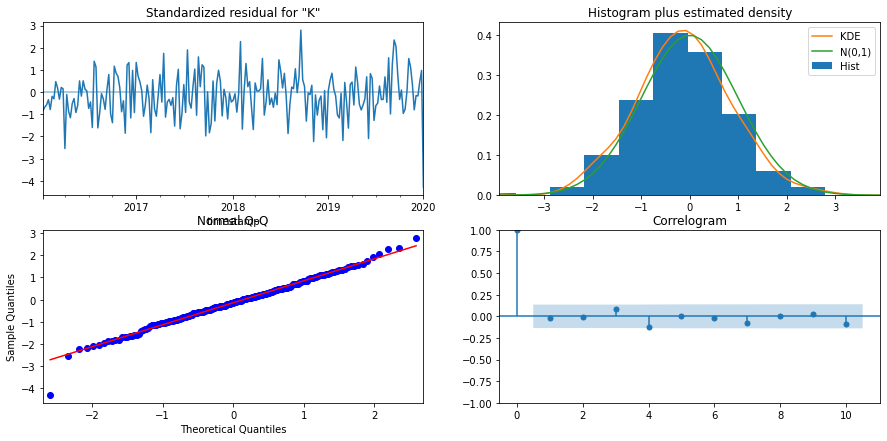


PREDICTION FOR TRAIN AND TEST sets: 



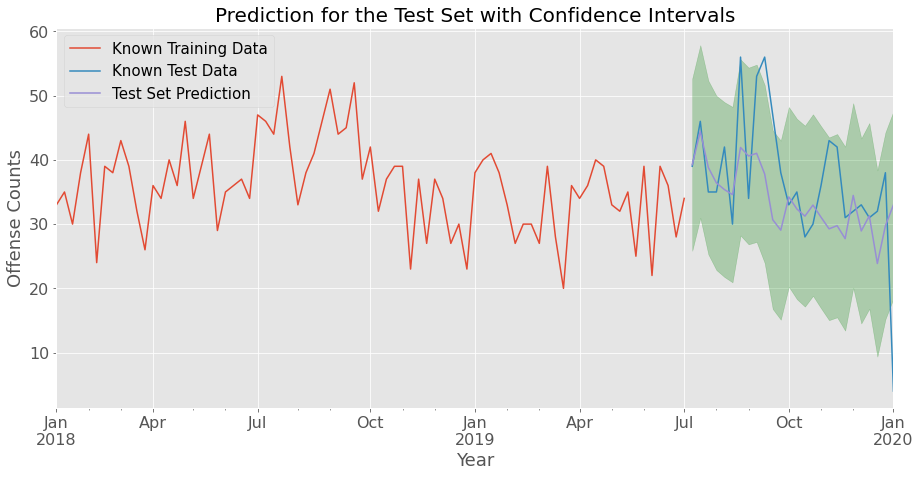


FORECAST: 



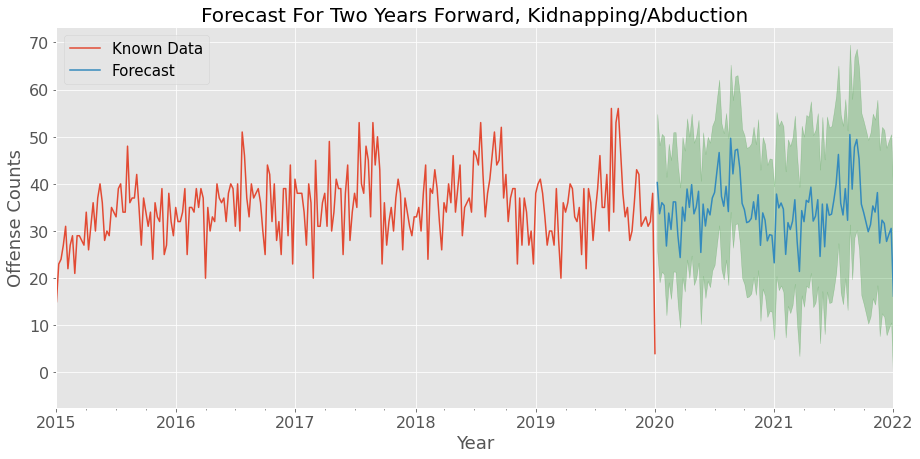

********************************************************************
OFFENSE CATEGORY: Robbery

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                             Robbery   No. Observations:                  262
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 52)   Log Likelihood                -835.654
Date:                             Thu, 29 Jul 2021   AIC                           1679.309
Time:                                     00:40:46   BIC                           1692.678
Sample:                                 01-04-2015   HQIC                          1684.714
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1493      0.086      1.738      0.082      -0.019       0.318
ma.L1         -0.9293      0.036    -25.568      0.000      -1.000      -0.858
ar.S.L52      -0.4793      0.065     -7.334      0.000      -0.607      -0.351
sigma2       161.6784     14.925     10.833      0.000     132.425     190.931
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 1.50
Prob(Q):                              0.89   Prob(JB):                         0.47
Heteroskedasticity (H):               1.23   Skew:                            -0.13
Prob(H) (two-sided):                  0.40   Kurtosis:                         3.32
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

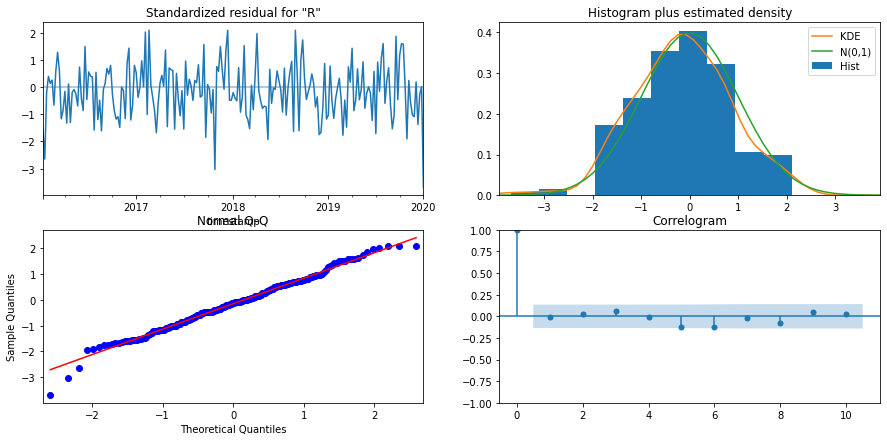


PREDICTION FOR TRAIN AND TEST sets: 



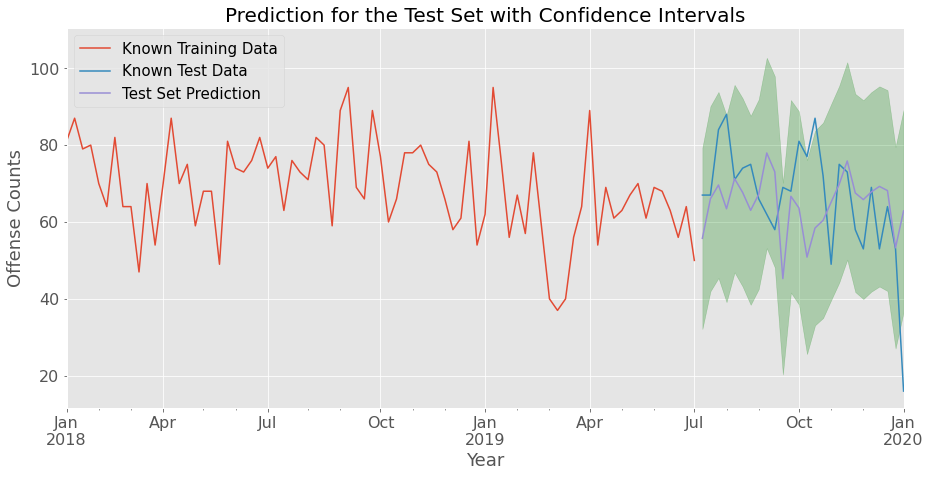


FORECAST: 



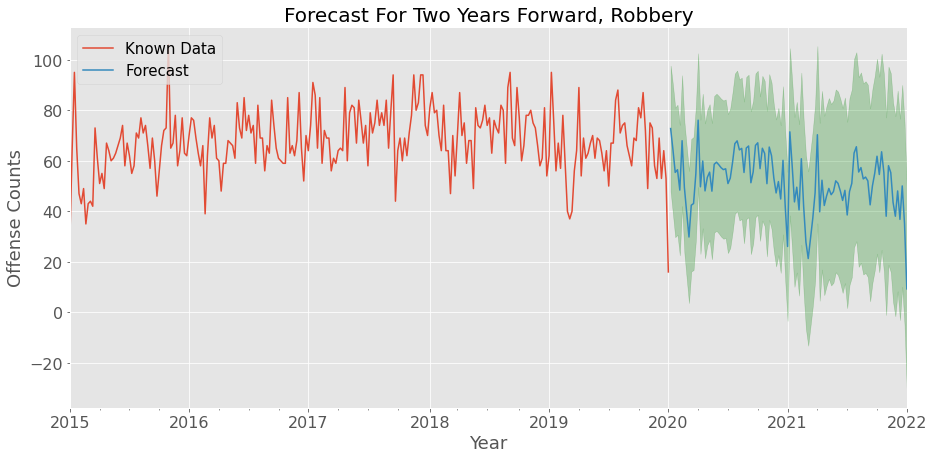

********************************************************************
OFFENSE CATEGORY: Extortion/Blackmail

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                 Extortion/Blackmail   No. Observations:                  261
Model:             SARIMAX(1, 1, 2)x(2, 1, [], 52)   Log Likelihood                -586.725
Date:                             Thu, 29 Jul 2021   AIC                           1185.449
Time:                                     00:40:47   BIC                           1205.474
Sample:                                 01-11-2015   HQIC                          1193.546
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6409      0.214     -2.992      0.003      -1.061      -0.221
ma.L1         -0.1107      0.174     -0.635      0.526      -0.452       0.231
ma.L2         -0.7017      0.156     -4.488      0.000      -1.008      -0.395
ar.S.L52      -0.6926      0.095     -7.254      0.000      -0.880      -0.505
ar.S.L104     -0.3277      0.078     -4.223      0.000      -0.480      -0.176
sigma2        14.2969      0.938     15.246      0.000      12.459      16.135
===================================================================================
Ljung-Box (L1) (Q):                   0.16   Jarque-Bera (JB):               159.88
Prob(Q):                              0.69   Prob(JB):                         0.00
Heteroskedasticity (H):               1.52   Skew:                             1.04
Prob(H) (two-sided):                  0.08   Kurtosis:                         6.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

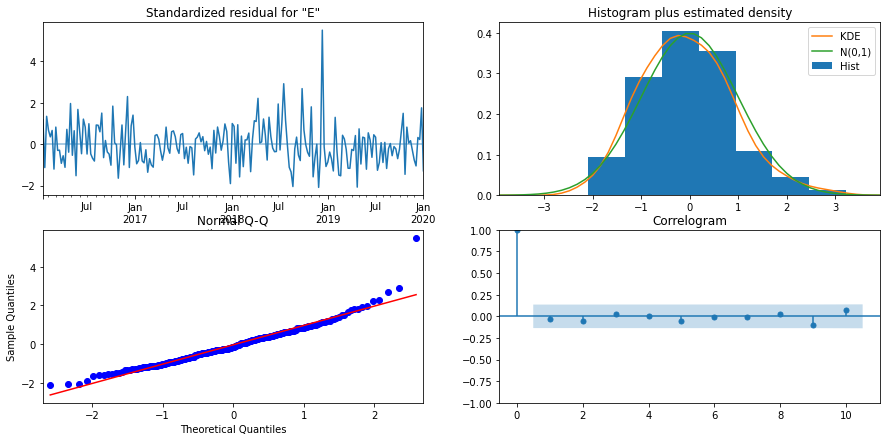


PREDICTION FOR TRAIN AND TEST sets: 



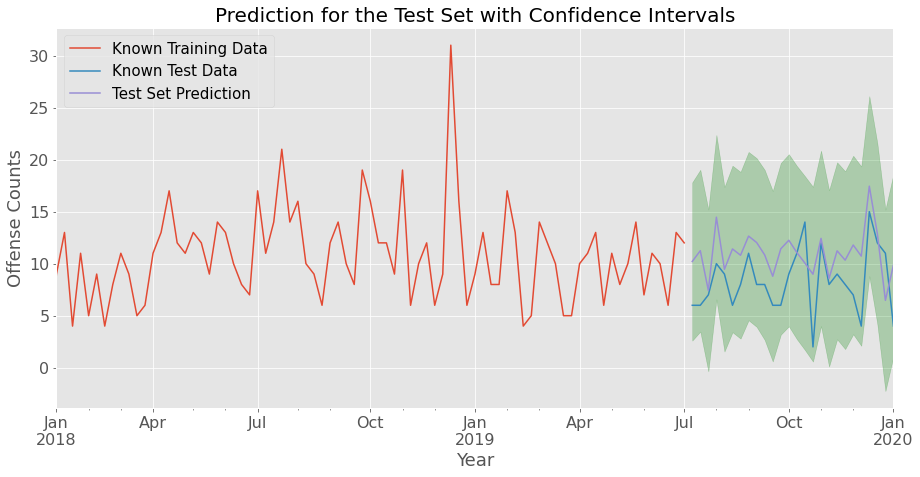


FORECAST: 



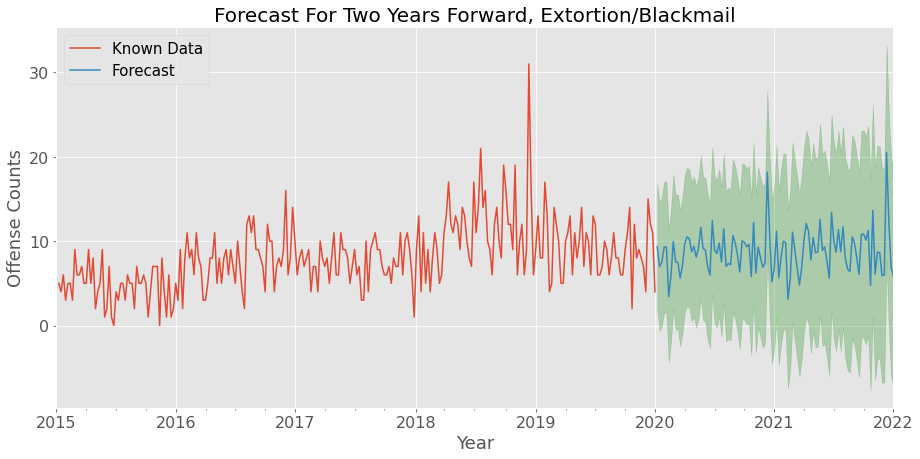

********************************************************************
OFFENSE CATEGORY: Pornography/Obscene Material

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:       Pornography/Obscene Material   No. Observations:                  262
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 52)   Log Likelihood                -670.395
Date:                            Thu, 29 Jul 2021   AIC                           1348.789
Time:                                    00:40:48   BIC                           1362.159
Sample:                                01-04-2015   HQIC                          1354.195
                                     - 01-05-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5977      0.065     -9.236      0.000      -0.724      -0.471
ar.L2         -0.3678      0.072     -5.127      0.000      -0.508      -0.227
ar.S.L52      -0.4428      0.077     -5.737      0.000      -0.594      -0.292
sigma2        33.8076      3.454      9.789      0.000      27.039      40.577
===================================================================================
Ljung-Box (L1) (Q):                   1.92   Jarque-Bera (JB):                 0.01
Prob(Q):                              0.17   Prob(JB):                         0.99
Heteroskedasticity (H):               1.26   Skew:                             0.02
Prob(H) (two-sided):                  0.34   Kurtosis:                         2.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

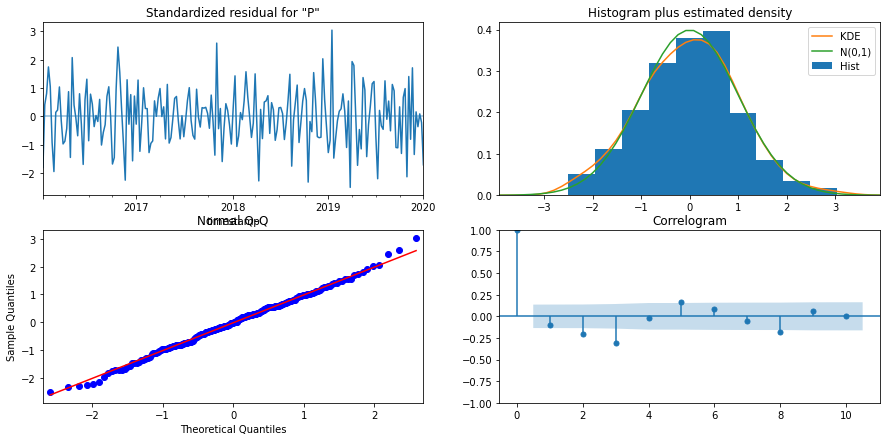


PREDICTION FOR TRAIN AND TEST sets: 



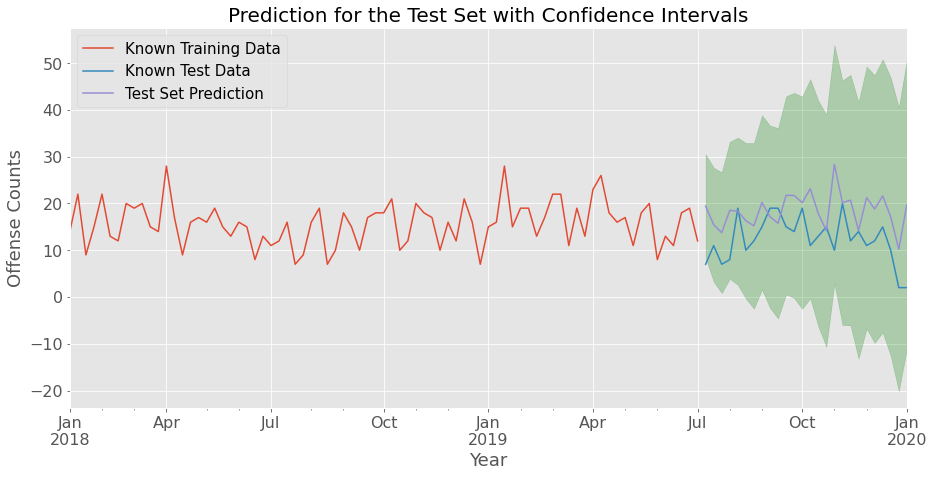


FORECAST: 



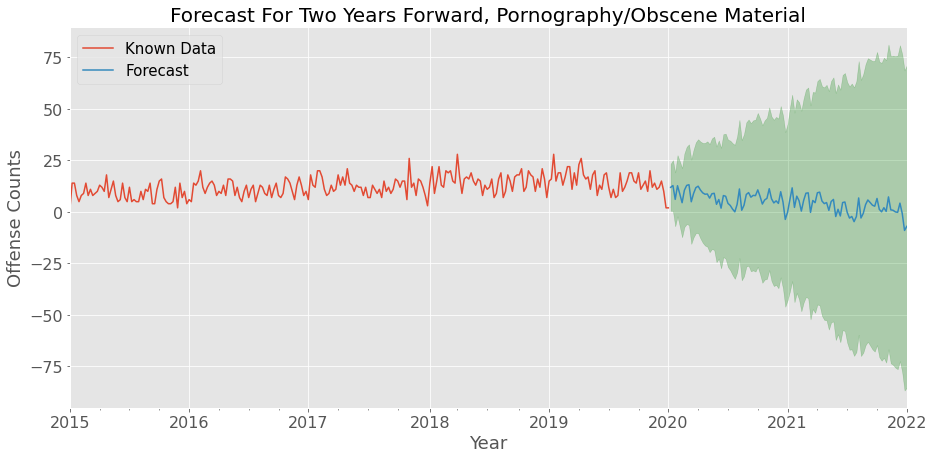

********************************************************************
OFFENSE CATEGORY: Prostitution Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:               Prostitution Offenses   No. Observations:                  261
Model:             SARIMAX(2, 1, 2)x(2, 1, [], 52)   Log Likelihood                -768.793
Date:                             Thu, 29 Jul 2021   AIC                           1551.586
Time:                                     00:40:48   BIC                           1574.949
Sample:                                 01-04-2015   HQIC                          1561.033
                                      - 12-29-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0872      0.378      0.230      0.818      -0.654       0.829
ar.L2         -0.1269      0.122     -1.041      0.298      -0.366       0.112
ma.L1         -1.2842      0.375     -3.426      0.001      -2.019      -0.550
ma.L2          0.3174      0.367      0.864      0.388      -0.403       1.038
ar.S.L52      -0.5900      0.050    -11.911      0.000      -0.687      -0.493
ar.S.L104     -0.4231      0.048     -8.855      0.000      -0.517      -0.329
sigma2        80.8415      5.606     14.420      0.000      69.854      91.829
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               319.98
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.76   Skew:                            -0.80
Prob(H) (two-sided):                  0.27   Kurtosis:                         8.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

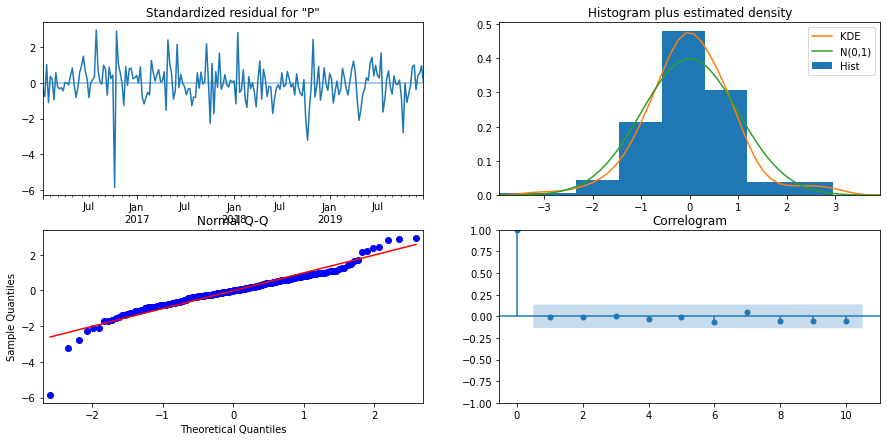


PREDICTION FOR TRAIN AND TEST sets: 



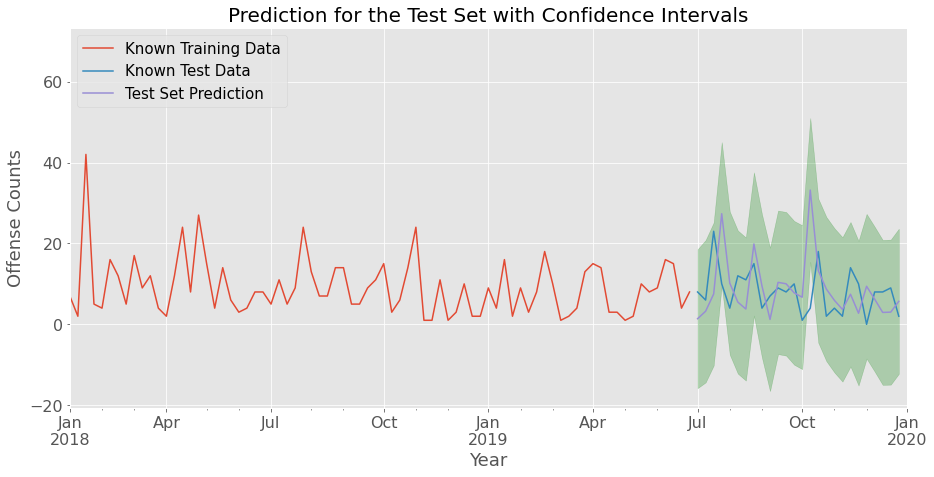


FORECAST: 



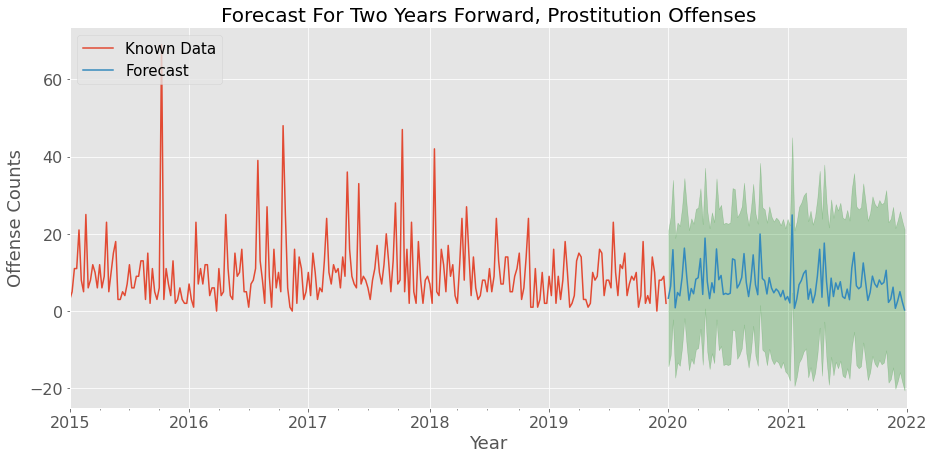

********************************************************************
OFFENSE CATEGORY: Bribery

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            Bribery   No. Observations:                  262
Model:             SARIMAX(1, 1, 0)x(2, 1, 0, 52)   Log Likelihood                -498.722
Date:                            Thu, 29 Jul 2021   AIC                           1005.443
Time:                                    00:40:49   BIC                           1018.813
Sample:                                01-04-2015   HQIC                          1010.849
                                     - 01-05-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5278      0.055     -9.665      0.000      -0.635      -0.421
ar.S.L52      -0.6081      0.087     -6.976      0.000      -0.779      -0.437
ar.S.L104     -0.3715      0.084     -4.423      0.000      -0.536      -0.207
sigma2         6.0779      0.461     13.197      0.000       5.175       6.981
===================================================================================
Ljung-Box (L1) (Q):                   7.09   Jarque-Bera (JB):                32.28
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               1.14   Skew:                             0.58
Prob(H) (two-sided):                  0.59   Kurtosis:                         4.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

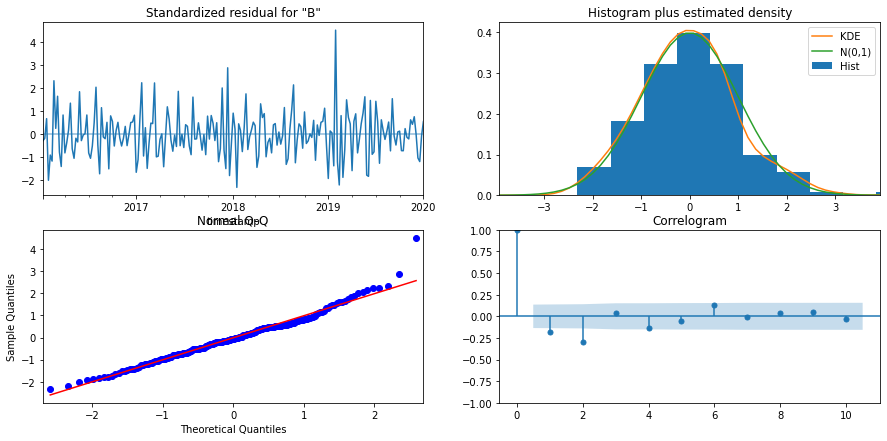


PREDICTION FOR TRAIN AND TEST sets: 



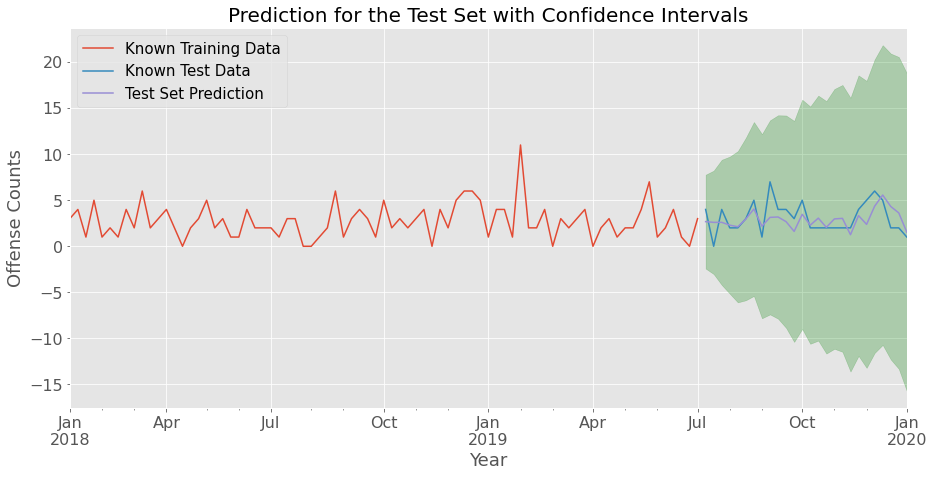


FORECAST: 



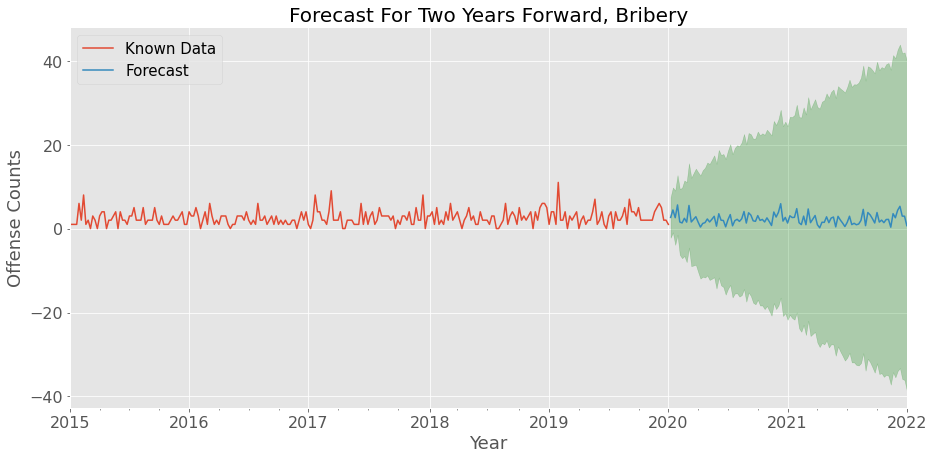

********************************************************************
OFFENSE CATEGORY: Embezzlement

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                        Embezzlement   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood                -582.761
Date:                             Thu, 29 Jul 2021   AIC                           1173.522
Time:                                     00:40:50   BIC                           1186.892
Sample:                                 01-04-2015   HQIC                          1178.928
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.0684      0.036    -29.657      0.000      -1.139      -0.998
ar.S.L52      -0.7387      0.077     -9.546      0.000      -0.890      -0.587
ar.S.L104     -0.3269      0.088     -3.707      0.000      -0.500      -0.154
sigma2        11.5611      1.365      8.468      0.000       8.885      14.237
===================================================================================
Ljung-Box (L1) (Q):                   0.95   Jarque-Bera (JB):                 1.28
Prob(Q):                              0.33   Prob(JB):                         0.53
Heteroskedasticity (H):               0.71   Skew:                             0.19
Prob(H) (two-sided):                  0.16   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

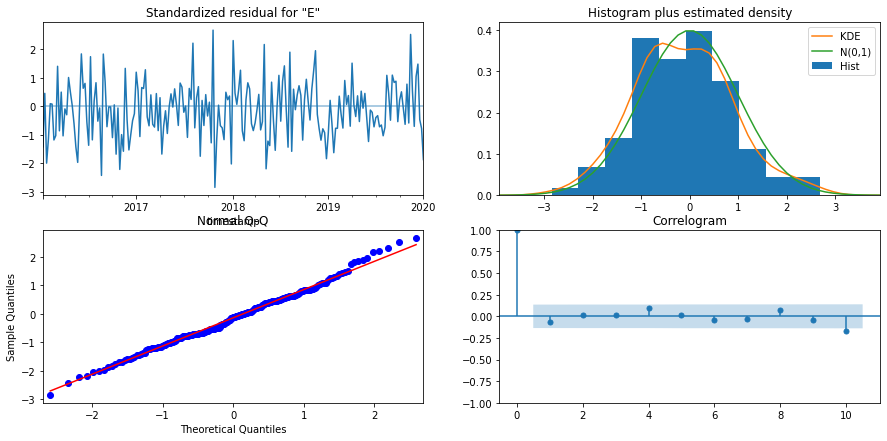


PREDICTION FOR TRAIN AND TEST sets: 



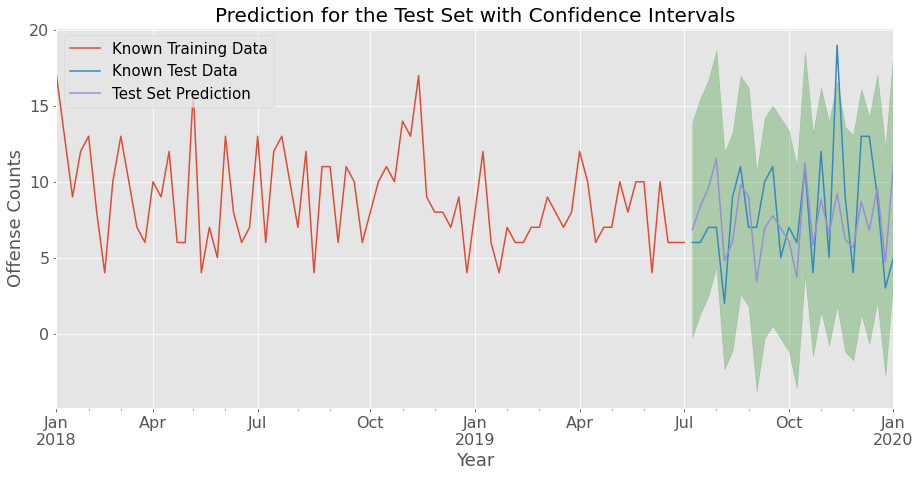


FORECAST: 



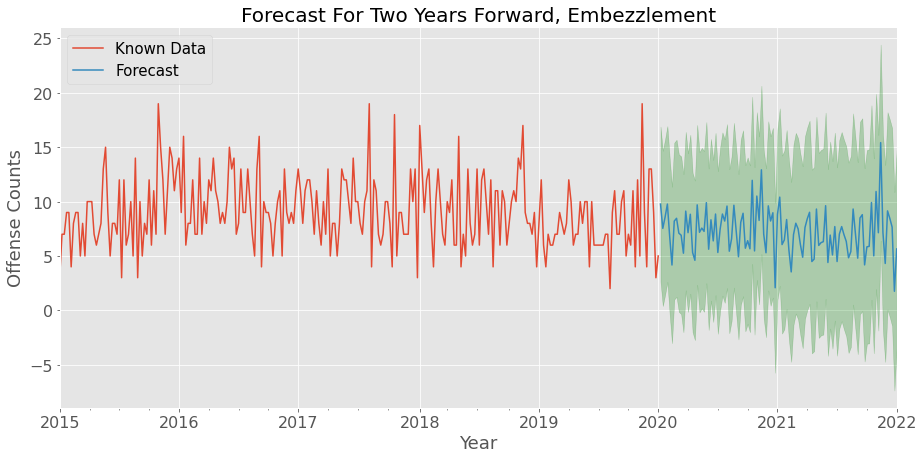

********************************************************************
OFFENSE CATEGORY: Homicide Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Homicide Offenses   No. Observations:                  262
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood                -488.621
Date:                             Thu, 29 Jul 2021   AIC                            985.242
Time:                                     00:40:51   BIC                            998.611
Sample:                                 01-04-2015   HQIC                           990.647
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.0235      0.020    -49.946      0.000      -1.064      -0.983
ar.S.L52      -0.7096      0.063    -11.268      0.000      -0.833      -0.586
ar.S.L104     -0.3780      0.092     -4.130      0.000      -0.557      -0.199
sigma2         5.0587      0.457     11.060      0.000       4.162       5.955
===================================================================================
Ljung-Box (L1) (Q):                   0.68   Jarque-Bera (JB):                17.33
Prob(Q):                              0.41   Prob(JB):                         0.00
Heteroskedasticity (H):               1.97   Skew:                             0.47
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

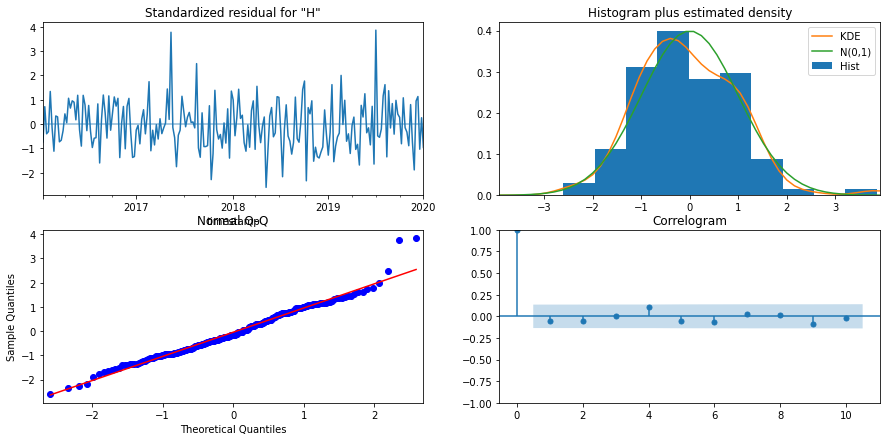


PREDICTION FOR TRAIN AND TEST sets: 



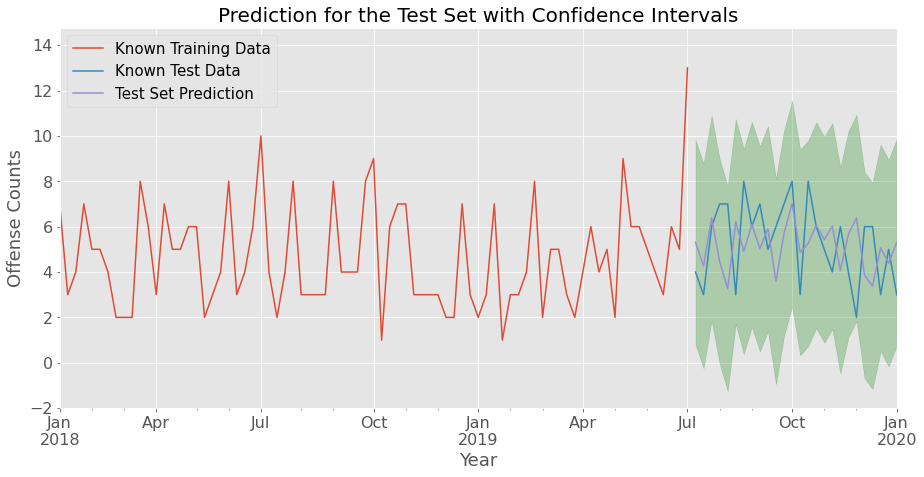


FORECAST: 



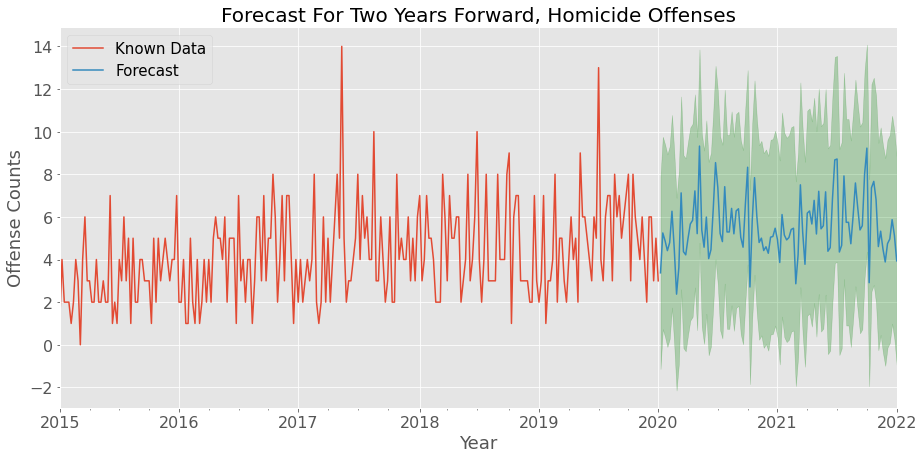

********************************************************************
OFFENSE CATEGORY: Human Trafficking

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Human Trafficking   No. Observations:                  254
Model:             SARIMAX(2, 1, 1)x(2, 1, [], 52)   Log Likelihood                -329.007
Date:                             Thu, 29 Jul 2021   AIC                            670.015
Time:                                     00:40:51   BIC                            689.834
Sample:                                 02-01-2015   HQIC                           678.035
                                      - 12-08-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0605      0.089      0.680      0.496      -0.114       0.235
ar.L2          0.1227      0.089      1.378      0.168      -0.052       0.297
ma.L1         -0.9674      0.030    -32.027      0.000      -1.027      -0.908
ar.S.L52      -0.7577      0.050    -15.241      0.000      -0.855      -0.660
ar.S.L104     -0.5915      0.048    -12.239      0.000      -0.686      -0.497
sigma2         1.1424      0.107     10.668      0.000       0.933       1.352
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               778.67
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               2.96   Skew:                             1.72
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

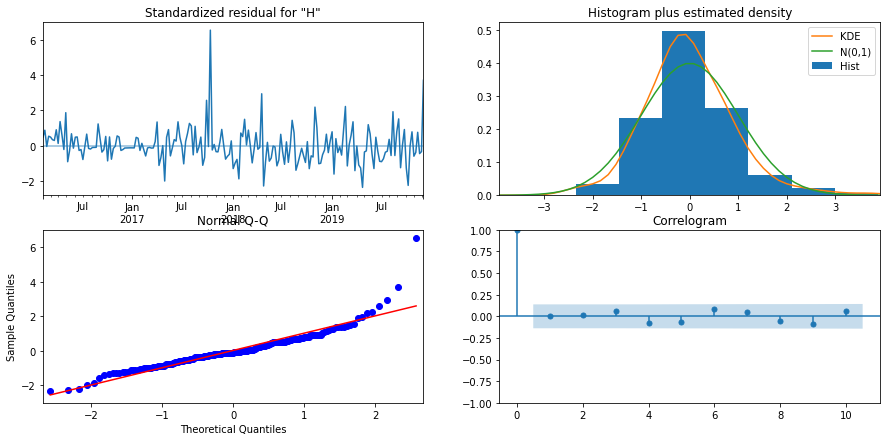


PREDICTION FOR TRAIN AND TEST sets: 



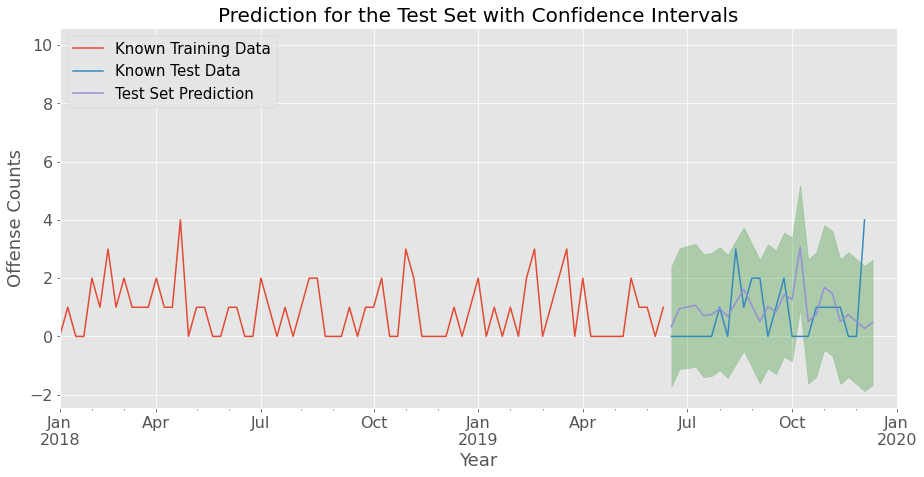


FORECAST: 



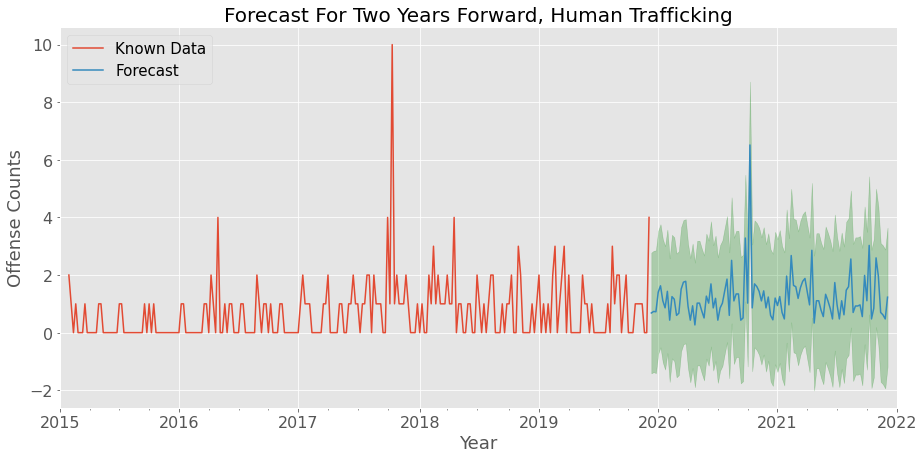

********************************************************************
OFFENSE CATEGORY: Gambling Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Gambling Offenses   No. Observations:                  230
Model:             SARIMAX(2, 1, 1)x(2, 1, [], 52)   Log Likelihood                -184.117
Date:                             Thu, 29 Jul 2021   AIC                            380.234
Time:                                     00:40:52   BIC                            399.291
Sample:                                 05-10-2015   HQIC                           387.962
                                      - 09-29-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0104      0.070      0.149      0.881      -0.126       0.147
ar.L2         -0.1026      0.072     -1.418      0.156      -0.244       0.039
ma.L1         -0.8722      0.037    -23.807      0.000      -0.944      -0.800
ar.S.L52      -0.7778      0.071    -10.981      0.000      -0.917      -0.639
ar.S.L104     -0.5218      0.048    -10.976      0.000      -0.615      -0.429
sigma2         0.3527      0.029     12.315      0.000       0.297       0.409
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               266.41
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               0.39   Skew:                             0.28
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

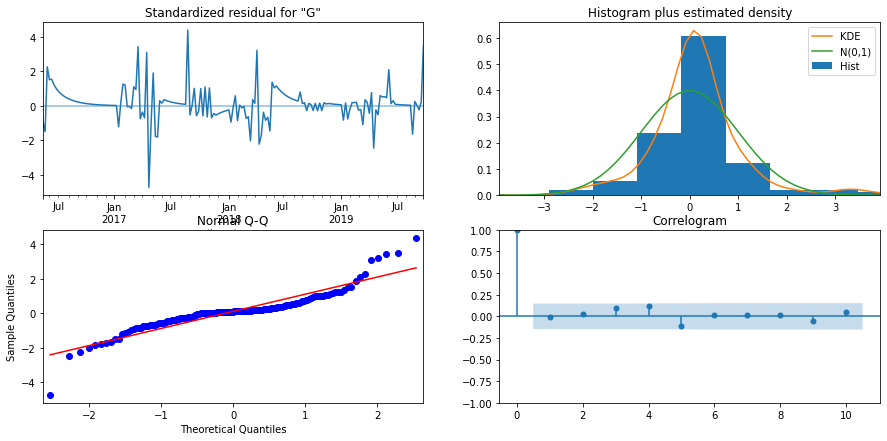


PREDICTION FOR TRAIN AND TEST sets: 



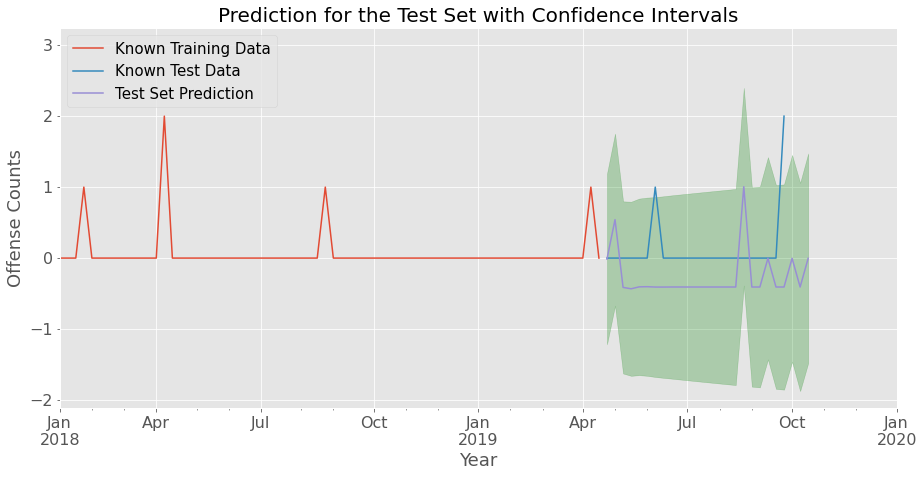


FORECAST: 



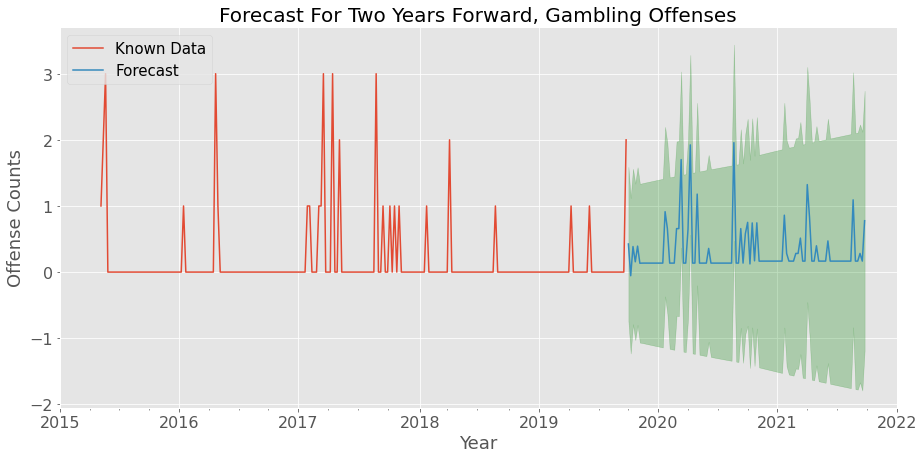

********************************************************************
OFFENSE CATEGORY: Animal Cruelty

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                      Animal Cruelty   No. Observations:                  196
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 52)   Log Likelihood                -450.562
Date:                             Thu, 29 Jul 2021   AIC                            909.124
Time:                                     00:40:53   BIC                            920.976
Sample:                                 04-10-2016   HQIC                           913.940
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6934      0.063    -10.953      0.000      -0.817      -0.569
ar.S.L52      -0.8118      0.130     -6.230      0.000      -1.067      -0.556
ar.S.L104     -0.3824      0.147     -2.597      0.009      -0.671      -0.094
sigma2        24.2980      3.551      6.843      0.000      17.339      31.257
===================================================================================
Ljung-Box (L1) (Q):                   0.45   Jarque-Bera (JB):                32.54
Prob(Q):                              0.50   Prob(JB):                         0.00
Heteroskedasticity (H):               2.19   Skew:                             0.89
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

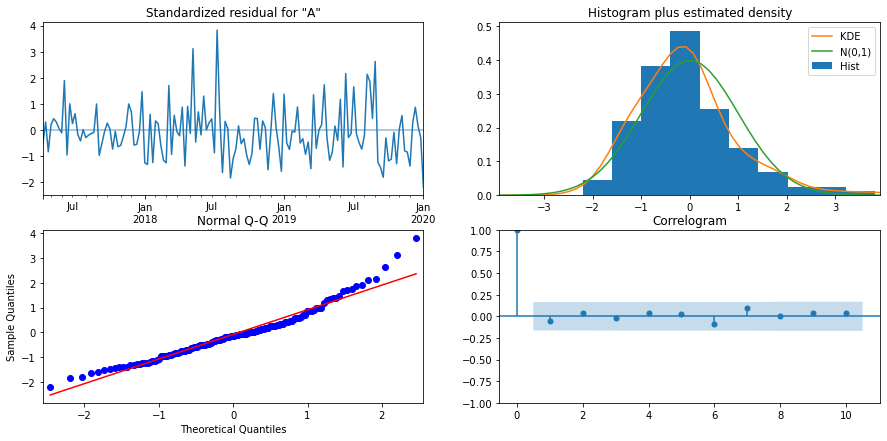


PREDICTION FOR TRAIN AND TEST sets: 



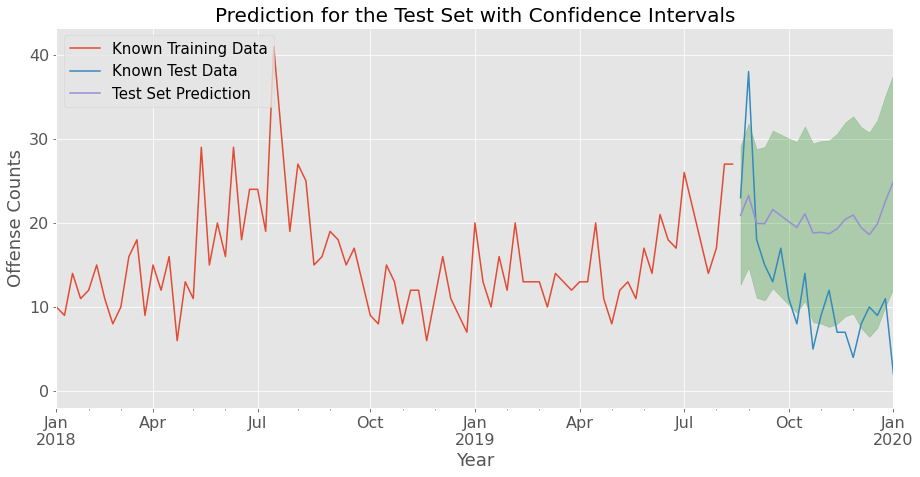


FORECAST: 



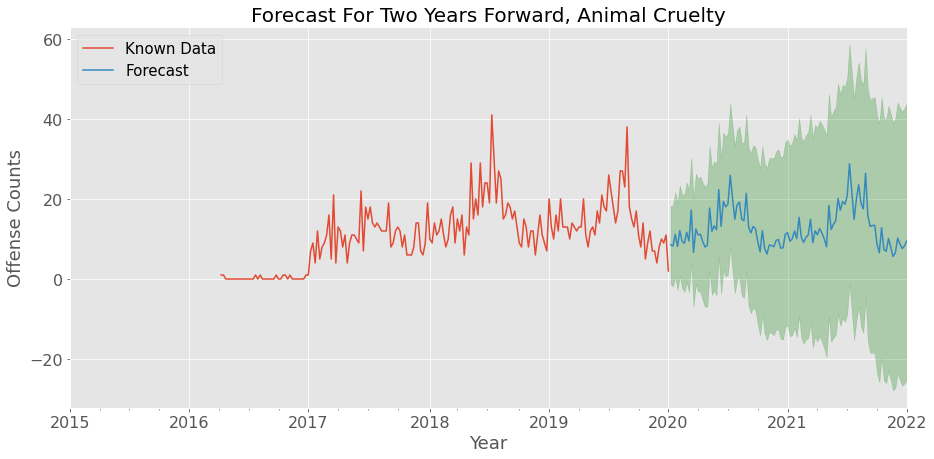

********************************************************************
OFFENSE CATEGORY: Sex Offenses

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                        Sex Offenses   No. Observations:                  262
Model:             SARIMAX(2, 0, 1)x(1, 0, [], 52)   Log Likelihood               -1150.300
Date:                             Thu, 29 Jul 2021   AIC                           2310.599
Time:                                     00:40:54   BIC                           2328.441
Sample:                                 01-04-2015   HQIC                          2317.770
                                      - 01-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8545      0.083     10.310      0.000       0.692       1.017
ar.L2          0.1441      0.082      1.752      0.080      -0.017       0.305
ma.L1         -0.8308      0.052    -16.010      0.000      -0.932      -0.729
ar.S.L52       0.3267      0.049      6.613      0.000       0.230       0.424
sigma2       366.4911     25.233     14.524      0.000     317.035     415.947
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                72.75
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               1.14   Skew:                            -0.10
Prob(H) (two-sided):                  0.55   Kurtosis:                         5.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

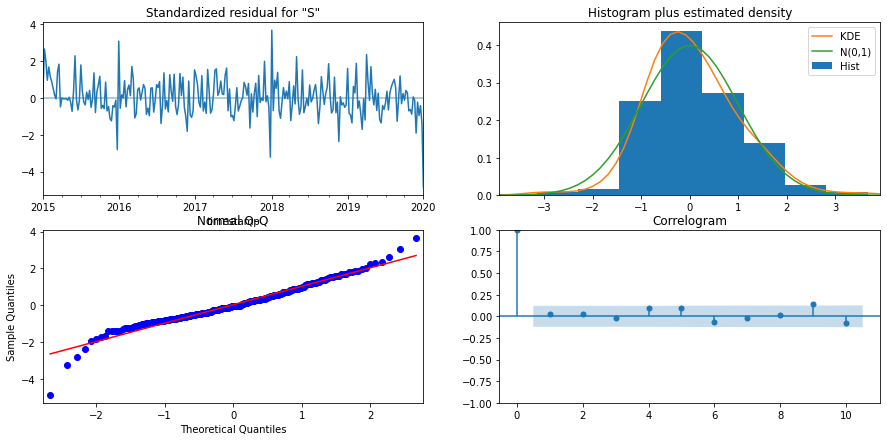


PREDICTION FOR TRAIN AND TEST sets: 



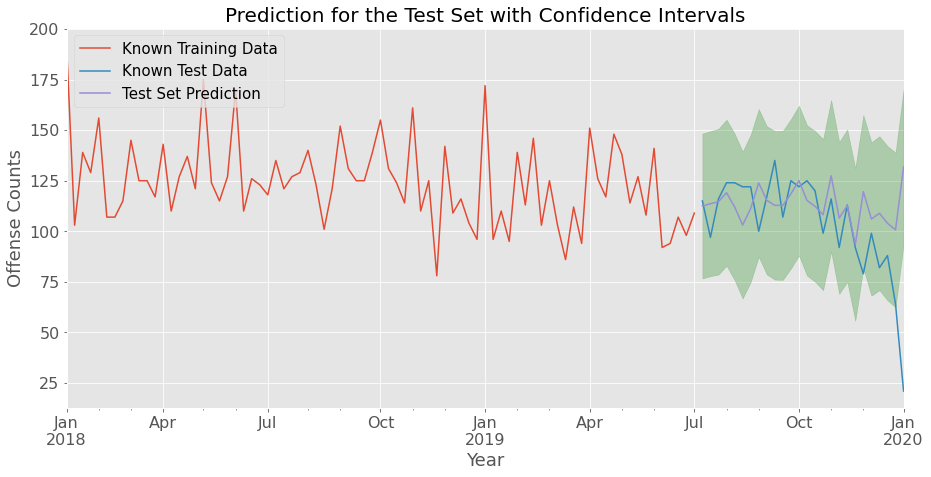


FORECAST: 



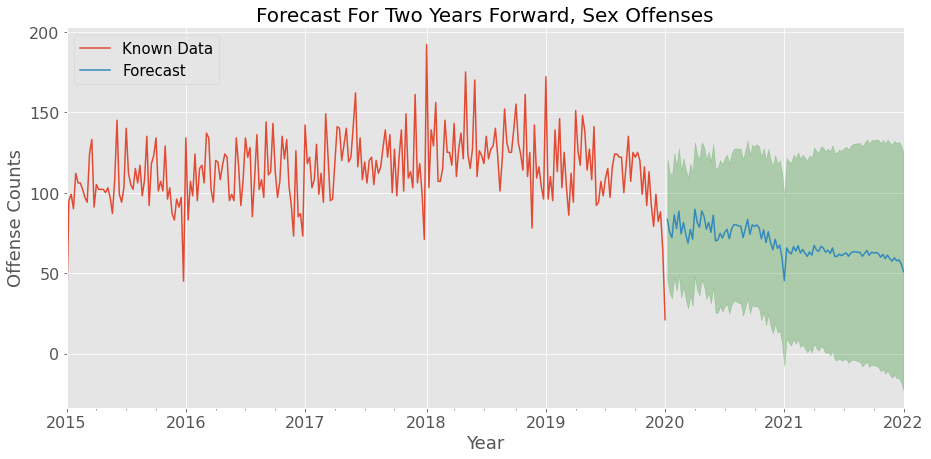

********************************************************************
OFFENSE CATEGORY: Weapon Law Violations

THE FINAL MODEL SUMMARY: 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:              Weapon Law Violations   No. Observations:                  262
Model:             SARIMAX(1, 0, 1)x(0, 0, 1, 52)   Log Likelihood               -1066.105
Date:                            Thu, 29 Jul 2021   AIC                           2140.210
Time:                                    00:40:55   BIC                           2154.483
Sample:                                01-04-2015   HQIC                          2145.946
                                     - 01-05-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000   9.32e-05   1.07e+04      0.000       1.000       1.000
ma.L1         -0.7818      0.041    -18.994      0.000      -0.863      -0.701
ma.S.L52       0.1099      0.058      1.880      0.060      -0.005       0.224
sigma2       194.3384     13.072     14.867      0.000     168.718     219.959
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                75.04
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                            -0.54
Prob(H) (two-sided):                  0.70   Kurtosis:                         5.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

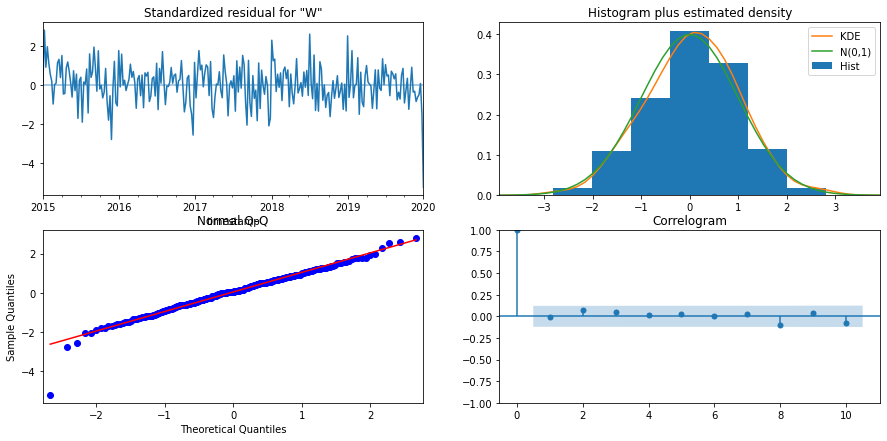


PREDICTION FOR TRAIN AND TEST sets: 



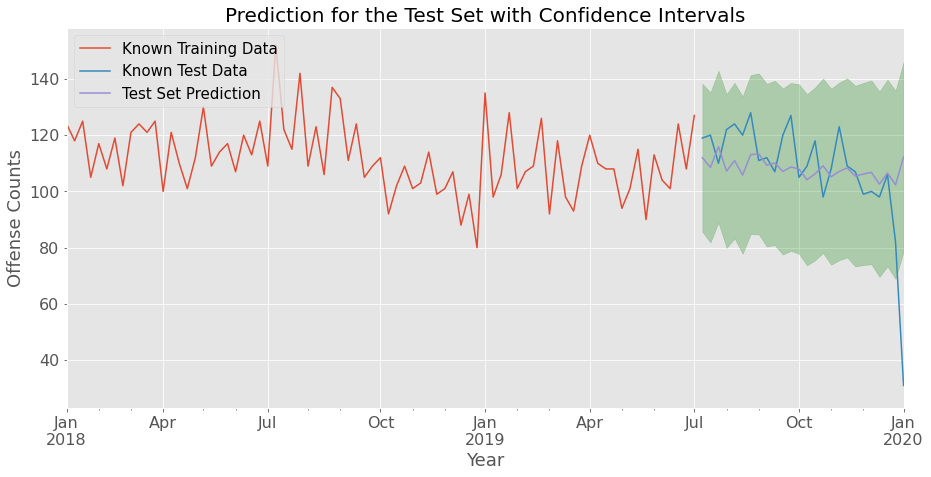


FORECAST: 



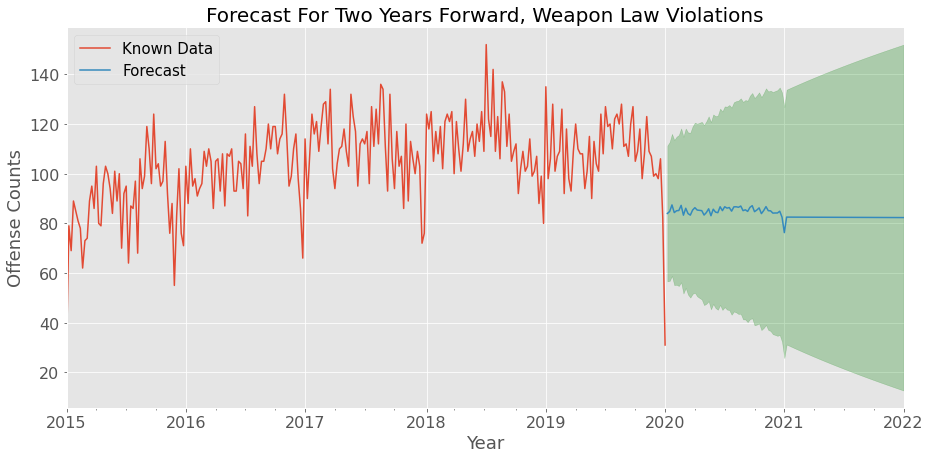

In [17]:
with open('data/pickled_models/RESULTS1.pickle', 'rb') as f:
    results1_back=pickle.load(f)

with open('data/pickled_models/RESULTS2.pickle', 'rb') as f:
    results2_back=pickle.load(f)

combined_results = {**results1_back, **results2_back}

print_out_models(combined_results)

<br><br><span style="font-size:1.2em;">The results of the modeling of crime categories have a broad spectrum of prediction and forecast accuracy. Some of the models work pretty well, while other display significant disagreement with actual data. One of the factors that seemingly affect the accuracy is the number of offenses in a category. For example, the "Animal Cruelty" and "Gambling Offenses" categories have very few data points, and the resulted models do not show good agreement with the test data set. However, even in such cases, the models were able to pick -up on the seasonal component of the timeseries if it was present in data. </span><br>

<br><br><span style="font-size:1.2em;">The worst performers in the crime categories models are:<br><br>
<span style="background:lightblue">1. Animal Cruelty<br>
    2. Gambling Offenses<br>
    3. Motor Vehicle Theft<br></span>
<br>
It is unclear what might be the factor behind a poor of Motor Vehicle Theft category's model.</span><br>

<br><br><span style="font-size:1.2em;">**It takes ~1 minute to run this notebook**</span>

<br><span style="font-size:1.2em;">The main notebook combining all of the partial ones can be found [here](capstone_project_main.ipynb)</span>